In [1]:
# Get the data for expeirment
import sklearn
import pandas as pd 
import numpy as np
import time

from sklearn import tree
from sklearn.metrics import r2_score
from sklearn.preprocessing import StandardScaler
from sklearn import preprocessing
from sklearn.metrics import explained_variance_score, mean_squared_error
from scipy.spatial.distance import cdist
from numpy.linalg import pinv
from math import sqrt

from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import KFold
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import geopy.distance as distance
from sklearn.preprocessing import MinMaxScaler

import Data_utils
import matplotlib.ticker as ticker
from functools import reduce
from collections import Counter

In [2]:
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
from tensorflow.keras import datasets, layers, models, losses

print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


In [3]:
# training = pd.read_csv('Data/ab_wind_train_data.txt')
# testing = pd.read_csv('Data/ab_wind_test_data.txt')
# All data without null, 2.5m
data = pd.read_csv('Data\processed_ab_wind.csv')

C:\Users\PPL\AppData\Local\Temp\ipykernel_65228\2481163954.py:4: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('Data\processed_ab_wind.csv')


In [4]:
grouped_by_date_data = data.groupby('date')

In [5]:
np.bincount(grouped_by_date_data.size()).argmax() #32 stations is the max number of stations for most dates

32

In [6]:
size = grouped_by_date_data.size()

Text(0.5, 0, 'Number of stations')

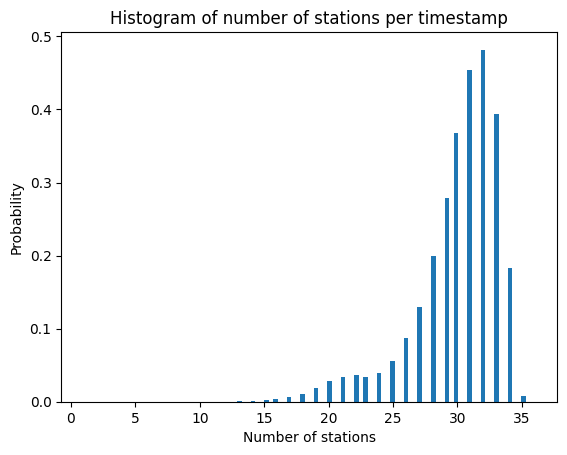

In [7]:
plt.hist(size, bins=100, density=True)
plt.title("Histogram of number of stations per timestamp")
plt.ylabel("Probability")
plt.xlabel("Number of stations")

In [8]:
number_of_stations_in_dates = [31, 32, 33, 34, 35] 
common_stations = []

for number in number_of_stations_in_dates:
    dates_with_major_stations = size.index[size == number]
    filtered_data = data.loc[data['date'].isin(dates_with_major_stations)]
    filtered_data_names = filtered_data.groupby('date')['name'].apply(list)
    filtered_data_names_list = filtered_data_names.values.tolist()
    res = list(reduce(lambda i, j: i & j, (set(x) for x in filtered_data_names_list[0:10])))
    
    common_stations.append(res)


In [9]:
common_station_names = list(reduce(lambda i, j: i & j, (set(x) for x in common_stations)))

In [10]:
dates_with_most_stations = size.index[size >= 31]

In [11]:
dates_with_most_stations

Index(['2014-05-28 14:00', '2014-05-28 16:00', '2014-05-28 17:00',
       '2014-05-29 11:00', '2014-05-29 19:00', '2014-05-30 02:00',
       '2014-05-30 11:00', '2014-05-31 14:00', '2014-05-31 19:00',
       '2014-05-31 20:00',
       ...
       '2023-09-14 11:00', '2023-09-14 12:00', '2023-09-14 13:00',
       '2023-09-14 14:00', '2023-09-14 15:00', '2023-09-14 16:00',
       '2023-09-14 17:00', '2023-09-14 18:00', '2023-09-14 19:00',
       '2023-09-14 20:00'],
      dtype='object', name='date', length=45590)

In [12]:
filtered_data = data.loc[data['date'].isin(dates_with_most_stations)]

In [16]:
filtered_data['name'].unique().shape

(38,)

In [17]:
teacher, student = train_test_split(dates_with_most_stations, test_size = 0.1)

In [18]:
#filtered_train_dates, filtered_test_dates = train_test_split(filtered_test_dates, test_size = 0.3)

In [19]:
filtered_teacher = filtered_data.loc[filtered_data['date'].isin(teacher) & filtered_data['name'].isin(common_station_names)]
filtered_student = filtered_data.loc[filtered_data['date'].isin(student) & filtered_data['name'].isin(common_station_names)]

In [22]:
filtered_student['name'].unique().shape

(25,)

In [40]:
# filtered_test.to_csv('Data\processed_ab_student.csv', sep = ',', index = False)
# filtered_train.to_csv('Data\processed_ab_teacher.csv', sep = ',', index = False)

In [42]:
train_dates, test_dates = train_test_split(teacher, test_size = 0.3)

In [45]:
train_data = filtered_teacher.loc[filtered_teacher['date'].isin(train_dates) & filtered_teacher['name'].isin(common_station_names)]
test_data = filtered_teacher.loc[filtered_teacher['date'].isin(test_dates) & filtered_teacher['name'].isin(common_station_names)]

In [48]:
# train_data.to_csv('Data\processed_ab_teacher_train.txt', sep = ',', index = False)
# test_data.to_csv('Data\processed_ab_teacher_test.txt', sep = ',', index = False)

In [12]:
train_data = pd.read_csv('Data\processed_ab_teacher_train.txt')
test_data = pd.read_csv('Data\processed_ab_teacher_test.txt')

C:\Users\PPL\AppData\Local\Temp\ipykernel_17916\1566597681.py:1: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  train_data = pd.read_csv('Data\processed_ab_teacher_train.txt')
C:\Users\PPL\AppData\Local\Temp\ipykernel_17916\1566597681.py:2: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  test_data = pd.read_csv('Data\processed_ab_teacher_test.txt')


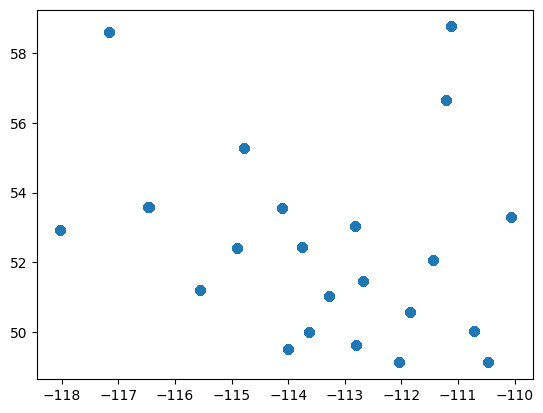

In [13]:
plt.scatter(x=train_data['longitude'], y=train_data['latitude'])
plt.show()

In [14]:
train_data_dates = train_data['date'].unique()

In [15]:
train_data_dates.shape

(28721,)

In [7]:
#train_data_dates,_ = train_test_split(train_data_dates, test_size = 0.4)

In [8]:
#train_data = train_data.loc[train_data['date'].isin(train_data_dates)]

In [9]:
#train_data['date'].unique().shape

(17232,)

In [16]:
# Source: From the TSmodel
def preprocess_data(train, validation):
    scaler = StandardScaler()
    train_data = scaler.fit_transform(train)
    validation_data = scaler.transform(validation)
    
    return train_data, validation_data

In [17]:
def fcm_rule_model(train_x, train_y, validation_x, validation_y):
    start_time = time.time()

    # Fcm hyperparameters
    FCM_Nc = 30
    FCM_m = 2
    tol = 1e-5
    max_iter = 200
        
    N = train_x.shape[0]
    U = np.random.rand(N, FCM_Nc)
    U = U / np.sum(U, axis=1, keepdims=True)
    qs = []

    # Fuzzy C-Means 聚类
    for _ in range(max_iter):
        U_old = U.copy()
        mf = U ** FCM_m
        cen = np.dot(mf.T, train_x) / np.sum(mf, axis=0, keepdims=True).T
        dists = cdist(train_x, cen)
        tmp = np.power(dists, -2 / (FCM_m - 1))
        U = tmp / np.sum(tmp, axis=1, keepdims=True)

        q = np.sum((U ** FCM_m) * (dists ** 2))
        qs.append(q)

        # 检查是否收敛
        if np.linalg.norm(U - U_old) < tol:
            break
    # 模型训练 find if this can be optimized
    z = np.hstack((np.ones((N, 1)), train_x))
    H = np.zeros((N, FCM_Nc * (train_x.shape[1] + 1)))

    # 生成模糊规则矩阵 H
    for j in range(FCM_Nc):
        Uj = np.tile(U[:, j], (train_x.shape[1] + 1, 1)).T
        H[:, (j * (train_x.shape[1] + 1)):((j + 1) * (train_x.shape[1] + 1))] = Uj * z

    # 计算权重 W
    W = pinv(np.dot(H.T, H)).dot(H.T).dot(train_y)

        
    # 在训练集上进行预测
    y_hat_train = np.dot(H, W)
    mse_train = mean_squared_error(train_y, y_hat_train)
    rmse_train = sqrt(mean_squared_error(train_y, y_hat_train))
    print("FCM traning RMSE:", rmse_train)
    
    # validation
    N_validation = validation_x.shape[0]
    z_validation = np.hstack((np.ones((N_validation, 1)), validation_x))
    H_validation = np.zeros((N_validation, FCM_Nc * (validation_x.shape[1] + 1)))
    dists_validation = cdist(validation_x, cen)
    tmp_validation = np.power(dists_validation, -2 / (FCM_m - 1))
    U_validation = tmp_validation / np.sum(tmp_validation, axis=1, keepdims=True)

    # 生成模糊规则矩阵 H_test
    for j in range(FCM_Nc):
        Uj_validation = np.tile(U_validation[:, j], (validation_x.shape[1] + 1, 1)).T
        H_validation[:, (j * (validation_x.shape[1] + 1)):((j + 1) * (validation_x.shape[1] + 1))] = Uj_validation * z_validation

    # validation set
    y_hat_validation = np.dot(H_validation, W)
    mse_validation = mean_squared_error(validation_y, y_hat_validation)
    rmse_validation = sqrt(mse_validation)
    print("FCM val RMSE:", rmse_validation)
    

    # 模型测试
#     N_test = test_x.shape[0]
#     z_test = np.hstack((np.ones((N_test, 1)), test_x))
#     H_test = np.zeros((N_test, FCM_Nc * (test_x.shape[1] + 1)))
#     dists_test = cdist(test_x, cen)
#     tmp_test = np.power(dists_test, -2 / (FCM_m - 1))
#     U_test = tmp_test / np.sum(tmp_test, axis=1, keepdims=True)

#     # 生成模糊规则矩阵 H_test
#     for j in range(FCM_Nc):
#         Uj_test = np.tile(U_test[:, j], (test_x.shape[1] + 1, 1)).T
#         H_test[:, (j * (test_x.shape[1] + 1)):((j + 1) * (test_x.shape[1] + 1))] = Uj_test * z_test

#     # 在测试集上进行预测
#     y_hat_test = np.dot(H_test, W)
#     mse_test = mean_squared_error(test_y, y_hat_test)
#     rmse_test = sqrt(mean_squared_error(test_y, y_hat_test))
#     print("test MSE:", mse_test)
#     print("test RMSE:", rmse_test)
#     test_results.append({'fcm_test':rmse_test})
    
        
#     print('r2 score')
#     print(r2_score(test_y, y_hat_test))


    # 绘制拟合曲线
#     plt.figure()
#     plt.subplot(1, 2, 1)
#     plt.plot([min(train_y),max(train_y)], [min(train_y),max(train_y)], 'k--')
#     plt.plot(train_y, y_hat_train, 'ro', alpha=.2)
#     plt.title('Training')
#     plt.legend()

#     plt.subplot(1, 2, 2)
#     plt.plot([min(validation_y),max(validation_y)], [min(validation_y),max(validation_y)], 'k--')
#     plt.plot(validation_y, y_hat_validation, 'ro', alpha=.2)
#     plt.title('Testing')
#     plt.legend()
#     plt.show()
    # Plot the prediction vs the true value
    plt.figure(figsize=(8,8))    
    plt.plot([min(validation_y),max(validation_y)], [min(validation_y),max(validation_y)], 'k--')
    plt.plot(validation_y, y_hat_validation, 'ro', alpha=.2)
    plt.title('TS model prediction vs true value for testing data')
    #plt.legend()
    plt.title('TS model optimization target Q v.s. iteration')
    plt.figure(figsize=(8,8))
    plt.plot(qs)
    #plt.show()

    return rmse_train, rmse_validation, time.time() - start_time


In [18]:
def linear_model(train_x, train_y, validation_x, validation_y):
    start_time = time.time()

    reg = LinearRegression().fit(train_x, train_y)
        
    train_pred = reg.predict(train_x)
    
    validation_pred = reg.predict(validation_x)
    
    print("linear train")
    print(mean_squared_error(train_y, train_pred, squared = False))
    
    print("linear_validation")
    print(mean_squared_error(validation_y, validation_pred, squared = False))
    
    return mean_squared_error(train_y, train_pred, squared = False), mean_squared_error(validation_y, validation_pred, squared = False),time.time() - start_time

In [19]:
def build_neural_network_model():
    model = models.Sequential()
    
    model.add(layers.Dense(30, activation=tf.keras.activations.tanh))    
    model.add(layers.Dense(1))    
    
    return model

In [20]:
def neural_network_model(train_x, train_y, validation_x, validation_y):
    start_time = time.time()
    
    neural_network_model = build_neural_network_model()
    
    neural_network_model.compile(
        optimizer='adam',
        loss=tf.keras.losses.MeanSquaredError(),
        metrics=[tf.keras.metrics.RootMeanSquaredError()]
    )
    
    history = neural_network_model.fit(
        train_x, 
        train_y, 
        epochs=number_of_epochs, 
        validation_data=(validation_x, validation_y)
    )
    
    return history, np.mean(np.array(history.history['root_mean_squared_error'])), np.mean(np.array(history.history['val_root_mean_squared_error'])), neural_network_model,time.time() - start_time

In [21]:
# Filter and process the data suitable for the training/testing
def generate_exp_data(raw_data, number_of_stations, max_threshold_distance, min_threshold_distance):
    # First fitler the data based on the settings
    x = []
    y = []

    for station in raw_data['name'].unique():
        features, target = Data_utils.generate_data(
            raw_data, 
            station, 
            number_of_stations, 
            max_threshold_distance, 
            min_threshold_distance
        )

        if (len(features)!=0) & (len(target)!=0):
            np_features = np.array(features)
            np_target = np.array(target)

            x.append(np_features)
            y.append(np_target)
    
    return x, y

In [23]:
# hyperparameters for the expeirment
number_of_neighbour_stations = [5,8, 10,12,13,14, 15,20,25,30]
number_of_epochs = 50

# Expeirment related parameters
number_of_folds = 5
# General hyperparameter
max_threshold_distance = 100000 #km
min_threshold_distance = 0 #km

# Results containers
training_results = []
training_times = []
validation_results = []
nn_histories = []

# Determine the optimal value for the given hyperparameter
def do_experiment(hyper_parameter_to_test_values, training_data):
    kf = KFold(n_splits=number_of_folds, shuffle=True)
    j = 9
    
    for hyperparameter_value in hyper_parameter_to_test_values:
        # First fitler the data based on the settings
        train_x, train_y = generate_exp_data(training_data, hyperparameter_value, max_threshold_distance, min_threshold_distance)
        
        # After all stations are filtered, flatten the data into a huge list        
        flatten_x = np.array([data for sublist in train_x for data in sublist])
        flatten_y = np.array([data for sublist in train_y for data in sublist])
        
        temp_x = pd.DataFrame(flatten_x)
        temp_x.to_csv(f"Data\exp\{j}x.csv")
        temp_y = pd.DataFrame(flatten_y)
        temp_y.to_csv(f"Data\exp\{j}y.csv")
        
        # After all data are ready, do a 10 fold cross validation
        training_results_fold = []
        validation_results_fold = []
        test_results_fold = []
        nn_history_fold = []
        
        for i, (train_index, val_index) in enumerate(kf.split(flatten_x)):
            split_train_x = flatten_x[train_index]
            split_train_y = flatten_y[train_index]

            split_val_x = flatten_x[val_index]
            split_val_y = flatten_y[val_index]
            # Normalize the input
            split_train_x, split_val_x = preprocess_data(split_train_x, split_val_x)            
            # Linear model
            li_train_rmse, li_val_rmse, li_train_time = linear_model(split_train_x, split_train_y, split_val_x , split_val_y)
            training_results_fold.append({'linear_train' : li_train_rmse})
            training_times.append({'linear_train' : li_train_time})
            validation_results_fold.append({'linear_val' : li_val_rmse})
            
            # FCM model
            fcm_train_rmse, fcm_val_rmse,fcm_train_time = fcm_rule_model(split_train_x, split_train_y, split_val_x , split_val_y)
            training_results_fold.append({'fcm_train' : fcm_train_rmse})
            training_times.append({'fcm_train' : fcm_train_time})
            validation_results_fold.append({'fcm_val' : fcm_val_rmse})
            
            # NN
            nn_history, nn_train_rmse, nn_val_rmse, nn_model, nn_train_time = neural_network_model(split_train_x, split_train_y, split_val_x , split_val_y)
            
            nn_val_prediction = nn_model.predict(split_val_x)
            # Plot the prediction vs the true value for neural network
            plt.figure(figsize=(8,8))    
            plt.plot([min(split_val_y),max(split_val_y)], [min(split_val_y),max(split_val_y)], 'k--')
            plt.plot(split_val_y, nn_val_prediction, 'ro', alpha=.2)
            plt.title('Neural network prediction vs true value for validation data')
            # Record results
            nn_history_fold.append(nn_history.history)
            training_results_fold.append({'nn_train' : nn_train_rmse})
            training_times.append({'nn_train' : nn_train_time})
            validation_results_fold.append({'nn_val' : nn_val_rmse})
        
        #After all folds are done, update the result containers
        training_results.append(training_results_fold)
        validation_results.append(validation_results_fold)
        nn_histories.append(nn_history_fold)
        j = j+1
        
        

linear train
6.940470396671946
linear_validation
6.937621598593054
FCM traning RMSE: 6.780796820984152
FCM val RMSE: 6.775577885375138
Epoch 1/50
12697/12697 [==============================] - 20s 1ms/step - loss: 50.3644 - root_mean_squared_error: 7.0968 - val_loss: 39.6395 - val_root_mean_squared_error: 6.2960
Epoch 2/50
12697/12697 [==============================] - 19s 2ms/step - loss: 38.8368 - root_mean_squared_error: 6.2319 - val_loss: 37.9698 - val_root_mean_squared_error: 6.1620
Epoch 3/50
12697/12697 [==============================] - 20s 2ms/step - loss: 37.7159 - root_mean_squared_error: 6.1413 - val_loss: 37.1863 - val_root_mean_squared_error: 6.0981
Epoch 4/50
12697/12697 [==============================] - 19s 2ms/step - loss: 37.1174 - root_mean_squared_error: 6.0924 - val_loss: 36.8745 - val_root_mean_squared_error: 6.0724
Epoch 5/50
12697/12697 [==============================] - 19s 2ms/step - loss: 36.7300 - root_mean_squared_error: 6.0605 - val_loss: 36.3898 - val_ro

Epoch 46/50
12697/12697 [==============================] - 19s 2ms/step - loss: 34.9861 - root_mean_squared_error: 5.9149 - val_loss: 35.4478 - val_root_mean_squared_error: 5.9538
Epoch 47/50
12697/12697 [==============================] - 19s 2ms/step - loss: 34.9952 - root_mean_squared_error: 5.9157 - val_loss: 35.1807 - val_root_mean_squared_error: 5.9313
Epoch 48/50
12697/12697 [==============================] - 19s 2ms/step - loss: 34.9930 - root_mean_squared_error: 5.9155 - val_loss: 35.3839 - val_root_mean_squared_error: 5.9484
Epoch 49/50
12697/12697 [==============================] - 19s 2ms/step - loss: 34.9708 - root_mean_squared_error: 5.9136 - val_loss: 35.1402 - val_root_mean_squared_error: 5.9279
Epoch 50/50
3175/3175 [==============================] - 2s 527us/step
linear train
6.940090656344156
linear_validation
6.939933922546223
FCM traning RMSE: 6.780165265042148
FCM val RMSE: 6.7840611739207715
Epoch 1/50
12697/12697 [==============================] - 19s 2ms/step - 

12697/12697 [==============================] - 19s 2ms/step - loss: 34.7170 - root_mean_squared_error: 5.8921 - val_loss: 35.2683 - val_root_mean_squared_error: 5.9387
Epoch 41/50
12697/12697 [==============================] - 19s 1ms/step - loss: 34.7086 - root_mean_squared_error: 5.8914 - val_loss: 35.0958 - val_root_mean_squared_error: 5.9242
Epoch 42/50
12697/12697 [==============================] - 19s 1ms/step - loss: 34.6998 - root_mean_squared_error: 5.8907 - val_loss: 35.0026 - val_root_mean_squared_error: 5.9163
Epoch 43/50
12697/12697 [==============================] - 20s 2ms/step - loss: 34.6997 - root_mean_squared_error: 5.8906 - val_loss: 35.1379 - val_root_mean_squared_error: 5.9277
Epoch 44/50
12697/12697 [==============================] - 19s 2ms/step - loss: 34.6778 - root_mean_squared_error: 5.8888 - val_loss: 35.1328 - val_root_mean_squared_error: 5.9273
Epoch 45/50
12697/12697 [==============================] - 19s 2ms/step - loss: 34.6628 - root_mean_squared_erro

12697/12697 [==============================] - 19s 2ms/step - loss: 34.9966 - root_mean_squared_error: 5.9158 - val_loss: 35.5200 - val_root_mean_squared_error: 5.9599
Epoch 35/50
12697/12697 [==============================] - 19s 2ms/step - loss: 35.0076 - root_mean_squared_error: 5.9167 - val_loss: 35.3883 - val_root_mean_squared_error: 5.9488
Epoch 36/50
12697/12697 [==============================] - 19s 1ms/step - loss: 34.9784 - root_mean_squared_error: 5.9143 - val_loss: 35.3814 - val_root_mean_squared_error: 5.9482
Epoch 37/50
12697/12697 [==============================] - 19s 1ms/step - loss: 34.9685 - root_mean_squared_error: 5.9134 - val_loss: 35.3310 - val_root_mean_squared_error: 5.9440
Epoch 38/50
12697/12697 [==============================] - 19s 2ms/step - loss: 34.9519 - root_mean_squared_error: 5.9120 - val_loss: 35.4039 - val_root_mean_squared_error: 5.9501
Epoch 39/50
12697/12697 [==============================] - 19s 1ms/step - loss: 34.9438 - root_mean_squared_erro

12697/12697 [==============================] - 19s 1ms/step - loss: 35.1050 - root_mean_squared_error: 5.9249 - val_loss: 35.3124 - val_root_mean_squared_error: 5.9424
Epoch 29/50
12697/12697 [==============================] - 19s 2ms/step - loss: 35.0980 - root_mean_squared_error: 5.9244 - val_loss: 35.2953 - val_root_mean_squared_error: 5.9410
Epoch 30/50
12697/12697 [==============================] - 19s 1ms/step - loss: 35.0742 - root_mean_squared_error: 5.9223 - val_loss: 35.0706 - val_root_mean_squared_error: 5.9220
Epoch 31/50
12697/12697 [==============================] - 19s 2ms/step - loss: 35.0714 - root_mean_squared_error: 5.9221 - val_loss: 35.1348 - val_root_mean_squared_error: 5.9275
Epoch 32/50
12697/12697 [==============================] - 19s 2ms/step - loss: 35.0413 - root_mean_squared_error: 5.9196 - val_loss: 35.1654 - val_root_mean_squared_error: 5.9300
Epoch 33/50
12697/12697 [==============================] - 19s 2ms/step - loss: 35.0435 - root_mean_squared_erro

12697/12697 [==============================] - 19s 2ms/step - loss: 35.1350 - root_mean_squared_error: 5.9275 - val_loss: 35.0484 - val_root_mean_squared_error: 5.9202
Epoch 23/50
12697/12697 [==============================] - 19s 2ms/step - loss: 35.1078 - root_mean_squared_error: 5.9252 - val_loss: 34.9890 - val_root_mean_squared_error: 5.9151
Epoch 24/50
12697/12697 [==============================] - 19s 2ms/step - loss: 35.0808 - root_mean_squared_error: 5.9229 - val_loss: 34.9579 - val_root_mean_squared_error: 5.9125
Epoch 25/50
12697/12697 [==============================] - 19s 2ms/step - loss: 35.0517 - root_mean_squared_error: 5.9204 - val_loss: 35.0047 - val_root_mean_squared_error: 5.9165
Epoch 26/50
12697/12697 [==============================] - 19s 1ms/step - loss: 35.0412 - root_mean_squared_error: 5.9196 - val_loss: 34.9405 - val_root_mean_squared_error: 5.9110
Epoch 27/50
12697/12697 [==============================] - 20s 2ms/step - loss: 35.0154 - root_mean_squared_erro

10547/10547 [==============================] - 39s 4ms/step - loss: 34.5907 - root_mean_squared_error: 5.8814 - val_loss: 34.3410 - val_root_mean_squared_error: 5.8601
Epoch 17/50
10547/10547 [==============================] - 39s 4ms/step - loss: 34.5477 - root_mean_squared_error: 5.8777 - val_loss: 34.4761 - val_root_mean_squared_error: 5.8716
Epoch 18/50
10547/10547 [==============================] - 39s 4ms/step - loss: 34.5071 - root_mean_squared_error: 5.8743 - val_loss: 34.5568 - val_root_mean_squared_error: 5.8785
Epoch 19/50
10547/10547 [==============================] - 39s 4ms/step - loss: 34.4607 - root_mean_squared_error: 5.8703 - val_loss: 34.5128 - val_root_mean_squared_error: 5.8748
Epoch 20/50
10547/10547 [==============================] - 39s 4ms/step - loss: 34.4500 - root_mean_squared_error: 5.8694 - val_loss: 34.2356 - val_root_mean_squared_error: 5.8511
Epoch 21/50
10547/10547 [==============================] - 39s 4ms/step - loss: 34.4206 - root_mean_squared_erro

10547/10547 [==============================] - 37s 4ms/step - loss: 34.8995 - root_mean_squared_error: 5.9076 - val_loss: 35.0886 - val_root_mean_squared_error: 5.9236
Epoch 11/50
10547/10547 [==============================] - 37s 4ms/step - loss: 34.8320 - root_mean_squared_error: 5.9019 - val_loss: 35.0746 - val_root_mean_squared_error: 5.9224
Epoch 12/50
10547/10547 [==============================] - 37s 3ms/step - loss: 34.7812 - root_mean_squared_error: 5.8976 - val_loss: 35.0014 - val_root_mean_squared_error: 5.9162
Epoch 13/50
10547/10547 [==============================] - 37s 4ms/step - loss: 34.7448 - root_mean_squared_error: 5.8945 - val_loss: 35.2469 - val_root_mean_squared_error: 5.9369
Epoch 14/50
10547/10547 [==============================] - 36s 3ms/step - loss: 34.6840 - root_mean_squared_error: 5.8893 - val_loss: 35.2419 - val_root_mean_squared_error: 5.9365
Epoch 15/50
10547/10547 [==============================] - 37s 3ms/step - loss: 34.6637 - root_mean_squared_erro

C:\Users\PPL\AppData\Local\Temp\ipykernel_17916\2725843011.py:66: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(8,8))


linear train
6.725971002585993
linear_validation
6.774510653493534
FCM traning RMSE: 6.607790821438287
FCM val RMSE: 6.646512302291695
Epoch 1/50
10547/10547 [==============================] - 37s 3ms/step - loss: 50.1078 - root_mean_squared_error: 7.0787 - val_loss: 38.9071 - val_root_mean_squared_error: 6.2376
Epoch 2/50
10547/10547 [==============================] - 44s 4ms/step - loss: 37.4445 - root_mean_squared_error: 6.1192 - val_loss: 37.0401 - val_root_mean_squared_error: 6.0861
Epoch 3/50
10547/10547 [==============================] - 42s 4ms/step - loss: 36.2831 - root_mean_squared_error: 6.0235 - val_loss: 36.4013 - val_root_mean_squared_error: 6.0333
Epoch 4/50
10547/10547 [==============================] - 43s 4ms/step - loss: 35.7724 - root_mean_squared_error: 5.9810 - val_loss: 35.8536 - val_root_mean_squared_error: 5.9878
Epoch 5/50
10547/10547 [==============================] - 43s 4ms/step - loss: 35.4657 - root_mean_squared_error: 5.9553 - val_loss: 35.4388 - val_ro

Epoch 46/50
10547/10547 [==============================] - 35s 3ms/step - loss: 34.0162 - root_mean_squared_error: 5.8323 - val_loss: 34.5189 - val_root_mean_squared_error: 5.8753
Epoch 47/50
10547/10547 [==============================] - 34s 3ms/step - loss: 34.0013 - root_mean_squared_error: 5.8311 - val_loss: 34.3764 - val_root_mean_squared_error: 5.8631
Epoch 48/50
10547/10547 [==============================] - 35s 3ms/step - loss: 33.9953 - root_mean_squared_error: 5.8306 - val_loss: 34.6470 - val_root_mean_squared_error: 5.8862
Epoch 49/50
10547/10547 [==============================] - 35s 3ms/step - loss: 33.9951 - root_mean_squared_error: 5.8305 - val_loss: 34.3691 - val_root_mean_squared_error: 5.8625
Epoch 50/50
2637/2637 [==============================] - 3s 1ms/step
linear train
6.743992071110872
linear_validation
6.702460208071259
FCM traning RMSE: 6.62171414072758
FCM val RMSE: 6.5851032977855315
Epoch 1/50
10547/10547 [==============================] - 35s 3ms/step - los

10547/10547 [==============================] - 32s 3ms/step - loss: 34.2116 - root_mean_squared_error: 5.8491 - val_loss: 34.3793 - val_root_mean_squared_error: 5.8634
Epoch 41/50
10547/10547 [==============================] - 31s 3ms/step - loss: 34.2058 - root_mean_squared_error: 5.8486 - val_loss: 34.3314 - val_root_mean_squared_error: 5.8593
Epoch 42/50
10547/10547 [==============================] - 32s 3ms/step - loss: 34.2036 - root_mean_squared_error: 5.8484 - val_loss: 34.2541 - val_root_mean_squared_error: 5.8527
Epoch 43/50
10547/10547 [==============================] - 32s 3ms/step - loss: 34.1904 - root_mean_squared_error: 5.8473 - val_loss: 34.2473 - val_root_mean_squared_error: 5.8521
Epoch 44/50
10547/10547 [==============================] - 32s 3ms/step - loss: 34.1785 - root_mean_squared_error: 5.8462 - val_loss: 34.4868 - val_root_mean_squared_error: 5.8725
Epoch 45/50
10547/10547 [==============================] - 32s 3ms/step - loss: 34.1762 - root_mean_squared_erro

10547/10547 [==============================] - 30s 3ms/step - loss: 34.1875 - root_mean_squared_error: 5.8470 - val_loss: 34.8727 - val_root_mean_squared_error: 5.9053
Epoch 35/50
10547/10547 [==============================] - 30s 3ms/step - loss: 34.1623 - root_mean_squared_error: 5.8449 - val_loss: 35.1381 - val_root_mean_squared_error: 5.9277
Epoch 36/50
10547/10547 [==============================] - 30s 3ms/step - loss: 34.1467 - root_mean_squared_error: 5.8435 - val_loss: 34.8682 - val_root_mean_squared_error: 5.9049
Epoch 37/50
10547/10547 [==============================] - 30s 3ms/step - loss: 34.1498 - root_mean_squared_error: 5.8438 - val_loss: 35.1629 - val_root_mean_squared_error: 5.9298
Epoch 38/50
10547/10547 [==============================] - 30s 3ms/step - loss: 34.1289 - root_mean_squared_error: 5.8420 - val_loss: 35.1358 - val_root_mean_squared_error: 5.9275
Epoch 39/50
10547/10547 [==============================] - 30s 3ms/step - loss: 34.1402 - root_mean_squared_erro

Epoch 29/50
8930/8930 [==============================] - 30s 3ms/step - loss: 34.0781 - root_mean_squared_error: 5.8376 - val_loss: 35.1861 - val_root_mean_squared_error: 5.9318
Epoch 30/50
8930/8930 [==============================] - 30s 3ms/step - loss: 34.0547 - root_mean_squared_error: 5.8356 - val_loss: 34.9420 - val_root_mean_squared_error: 5.9112
Epoch 31/50
8930/8930 [==============================] - 30s 3ms/step - loss: 34.0498 - root_mean_squared_error: 5.8352 - val_loss: 35.0364 - val_root_mean_squared_error: 5.9192
Epoch 32/50
8930/8930 [==============================] - 30s 3ms/step - loss: 34.0458 - root_mean_squared_error: 5.8349 - val_loss: 35.1656 - val_root_mean_squared_error: 5.9301
Epoch 33/50
8930/8930 [==============================] - 30s 3ms/step - loss: 34.0152 - root_mean_squared_error: 5.8323 - val_loss: 35.0643 - val_root_mean_squared_error: 5.9215
Epoch 34/50
8930/8930 [==============================] - 31s 3ms/step - loss: 34.0180 - root_mean_squared_erro

Epoch 24/50
8930/8930 [==============================] - 27s 3ms/step - loss: 34.2712 - root_mean_squared_error: 5.8542 - val_loss: 34.5632 - val_root_mean_squared_error: 5.8790
Epoch 25/50
8930/8930 [==============================] - 27s 3ms/step - loss: 34.2169 - root_mean_squared_error: 5.8495 - val_loss: 34.6012 - val_root_mean_squared_error: 5.8823
Epoch 26/50
8930/8930 [==============================] - 27s 3ms/step - loss: 34.2019 - root_mean_squared_error: 5.8482 - val_loss: 34.7446 - val_root_mean_squared_error: 5.8945
Epoch 27/50
8930/8930 [==============================] - 27s 3ms/step - loss: 34.1874 - root_mean_squared_error: 5.8470 - val_loss: 34.6014 - val_root_mean_squared_error: 5.8823
Epoch 28/50
8930/8930 [==============================] - 28s 3ms/step - loss: 34.1723 - root_mean_squared_error: 5.8457 - val_loss: 34.6000 - val_root_mean_squared_error: 5.8822
Epoch 29/50
8930/8930 [==============================] - 29s 3ms/step - loss: 34.1551 - root_mean_squared_erro

Epoch 19/50
8930/8930 [==============================] - 27s 3ms/step - loss: 34.2856 - root_mean_squared_error: 5.8554 - val_loss: 34.4075 - val_root_mean_squared_error: 5.8658
Epoch 20/50
8930/8930 [==============================] - 27s 3ms/step - loss: 34.2789 - root_mean_squared_error: 5.8548 - val_loss: 34.3828 - val_root_mean_squared_error: 5.8637
Epoch 21/50
8930/8930 [==============================] - 29s 3ms/step - loss: 34.2511 - root_mean_squared_error: 5.8524 - val_loss: 34.7316 - val_root_mean_squared_error: 5.8933
Epoch 22/50
8930/8930 [==============================] - 29s 3ms/step - loss: 34.2203 - root_mean_squared_error: 5.8498 - val_loss: 35.0483 - val_root_mean_squared_error: 5.9202
Epoch 23/50
8930/8930 [==============================] - 30s 3ms/step - loss: 34.1970 - root_mean_squared_error: 5.8478 - val_loss: 34.4975 - val_root_mean_squared_error: 5.8735
Epoch 24/50
8930/8930 [==============================] - 31s 3ms/step - loss: 34.2009 - root_mean_squared_erro

Epoch 14/50
8930/8930 [==============================] - 31s 3ms/step - loss: 34.5938 - root_mean_squared_error: 5.8816 - val_loss: 34.6103 - val_root_mean_squared_error: 5.8831
Epoch 15/50
8930/8930 [==============================] - 30s 3ms/step - loss: 34.5624 - root_mean_squared_error: 5.8790 - val_loss: 34.5400 - val_root_mean_squared_error: 5.8771
Epoch 16/50
8930/8930 [==============================] - 30s 3ms/step - loss: 34.5246 - root_mean_squared_error: 5.8758 - val_loss: 34.2640 - val_root_mean_squared_error: 5.8535
Epoch 17/50
8930/8930 [==============================] - 30s 3ms/step - loss: 34.4932 - root_mean_squared_error: 5.8731 - val_loss: 34.3906 - val_root_mean_squared_error: 5.8644
Epoch 18/50
8930/8930 [==============================] - 31s 3ms/step - loss: 34.4411 - root_mean_squared_error: 5.8687 - val_loss: 34.3054 - val_root_mean_squared_error: 5.8571
Epoch 19/50
8930/8930 [==============================] - 30s 3ms/step - loss: 34.3839 - root_mean_squared_erro

Epoch 9/50
8930/8930 [==============================] - 29s 3ms/step - loss: 34.6427 - root_mean_squared_error: 5.8858 - val_loss: 35.3738 - val_root_mean_squared_error: 5.9476
Epoch 10/50
8930/8930 [==============================] - 29s 3ms/step - loss: 34.6102 - root_mean_squared_error: 5.8830 - val_loss: 35.0745 - val_root_mean_squared_error: 5.9224
Epoch 11/50
8930/8930 [==============================] - 29s 3ms/step - loss: 34.5369 - root_mean_squared_error: 5.8768 - val_loss: 34.9926 - val_root_mean_squared_error: 5.9155
Epoch 12/50
8930/8930 [==============================] - 30s 3ms/step - loss: 34.4967 - root_mean_squared_error: 5.8734 - val_loss: 34.9798 - val_root_mean_squared_error: 5.9144
Epoch 13/50
8930/8930 [==============================] - 29s 3ms/step - loss: 34.4411 - root_mean_squared_error: 5.8687 - val_loss: 34.9190 - val_root_mean_squared_error: 5.9092
Epoch 14/50
8930/8930 [==============================] - 29s 3ms/step - loss: 34.4043 - root_mean_squared_error

Epoch 4/50
8348/8348 [==============================] - 10s 1ms/step - loss: 35.9714 - root_mean_squared_error: 5.9976 - val_loss: 36.4497 - val_root_mean_squared_error: 6.0374
Epoch 5/50
8348/8348 [==============================] - 10s 1ms/step - loss: 35.5899 - root_mean_squared_error: 5.9657 - val_loss: 36.3068 - val_root_mean_squared_error: 6.0255
Epoch 6/50
8348/8348 [==============================] - 10s 1ms/step - loss: 35.3234 - root_mean_squared_error: 5.9434 - val_loss: 35.5673 - val_root_mean_squared_error: 5.9638
Epoch 7/50
8348/8348 [==============================] - 10s 1ms/step - loss: 35.1384 - root_mean_squared_error: 5.9278 - val_loss: 35.6742 - val_root_mean_squared_error: 5.9728
Epoch 8/50
8348/8348 [==============================] - 10s 1ms/step - loss: 35.0353 - root_mean_squared_error: 5.9191 - val_loss: 35.5785 - val_root_mean_squared_error: 5.9648
Epoch 9/50
8348/8348 [==============================] - 10s 1ms/step - loss: 34.9297 - root_mean_squared_error: 5.9

2088/2088 [==============================] - 1s 525us/step
linear train
6.862123485655097
linear_validation
6.889240835600794
FCM traning RMSE: 6.747973038484447
FCM val RMSE: 6.780357461224973
Epoch 1/50
8349/8349 [==============================] - 13s 2ms/step - loss: 54.6419 - root_mean_squared_error: 7.3920 - val_loss: 39.4908 - val_root_mean_squared_error: 6.2842
Epoch 2/50
8349/8349 [==============================] - 12s 1ms/step - loss: 37.8652 - root_mean_squared_error: 6.1535 - val_loss: 37.1232 - val_root_mean_squared_error: 6.0929
Epoch 3/50
8349/8349 [==============================] - 13s 2ms/step - loss: 36.3943 - root_mean_squared_error: 6.0328 - val_loss: 36.1368 - val_root_mean_squared_error: 6.0114
Epoch 4/50
8349/8349 [==============================] - 13s 2ms/step - loss: 35.8616 - root_mean_squared_error: 5.9885 - val_loss: 36.2026 - val_root_mean_squared_error: 6.0169
Epoch 5/50
8349/8349 [==============================] - 12s 1ms/step - loss: 35.5252 - root_mean_s

8349/8349 [==============================] - 13s 2ms/step - loss: 34.1529 - root_mean_squared_error: 5.8441 - val_loss: 34.7340 - val_root_mean_squared_error: 5.8936
Epoch 46/50
8349/8349 [==============================] - 12s 1ms/step - loss: 34.1285 - root_mean_squared_error: 5.8420 - val_loss: 35.1484 - val_root_mean_squared_error: 5.9286
Epoch 47/50
8349/8349 [==============================] - 13s 2ms/step - loss: 34.1549 - root_mean_squared_error: 5.8442 - val_loss: 34.5121 - val_root_mean_squared_error: 5.8747
Epoch 48/50
8349/8349 [==============================] - 12s 1ms/step - loss: 34.1135 - root_mean_squared_error: 5.8407 - val_loss: 34.5938 - val_root_mean_squared_error: 5.8817
Epoch 49/50
8349/8349 [==============================] - 13s 2ms/step - loss: 34.1321 - root_mean_squared_error: 5.8423 - val_loss: 34.7103 - val_root_mean_squared_error: 5.8915
Epoch 50/50
2087/2087 [==============================] - 1s 531us/step
linear train
6.875515659389562
linear_validation
6.

8349/8349 [==============================] - 13s 2ms/step - loss: 34.2624 - root_mean_squared_error: 5.8534 - val_loss: 34.5384 - val_root_mean_squared_error: 5.8769
Epoch 41/50
8349/8349 [==============================] - 12s 1ms/step - loss: 34.2394 - root_mean_squared_error: 5.8514 - val_loss: 34.5827 - val_root_mean_squared_error: 5.8807
Epoch 42/50
8349/8349 [==============================] - 12s 1ms/step - loss: 34.2552 - root_mean_squared_error: 5.8528 - val_loss: 34.3809 - val_root_mean_squared_error: 5.8635
Epoch 43/50
8349/8349 [==============================] - 13s 2ms/step - loss: 34.2361 - root_mean_squared_error: 5.8512 - val_loss: 34.4146 - val_root_mean_squared_error: 5.8664
Epoch 44/50
8349/8349 [==============================] - 12s 1ms/step - loss: 34.2273 - root_mean_squared_error: 5.8504 - val_loss: 34.5867 - val_root_mean_squared_error: 5.8810
Epoch 45/50
8349/8349 [==============================] - 12s 1ms/step - loss: 34.2394 - root_mean_squared_error: 5.8514 - 

8349/8349 [==============================] - 13s 2ms/step - loss: 33.9886 - root_mean_squared_error: 5.8300 - val_loss: 35.1049 - val_root_mean_squared_error: 5.9249
Epoch 36/50
8349/8349 [==============================] - 13s 2ms/step - loss: 33.9772 - root_mean_squared_error: 5.8290 - val_loss: 34.7704 - val_root_mean_squared_error: 5.8966
Epoch 37/50
8349/8349 [==============================] - 13s 2ms/step - loss: 33.9650 - root_mean_squared_error: 5.8280 - val_loss: 34.8570 - val_root_mean_squared_error: 5.9040
Epoch 38/50
8349/8349 [==============================] - 13s 2ms/step - loss: 33.9550 - root_mean_squared_error: 5.8271 - val_loss: 34.6799 - val_root_mean_squared_error: 5.8890
Epoch 39/50
8349/8349 [==============================] - 13s 2ms/step - loss: 33.9274 - root_mean_squared_error: 5.8247 - val_loss: 34.9021 - val_root_mean_squared_error: 5.9078
Epoch 40/50
8349/8349 [==============================] - 12s 1ms/step - loss: 33.9232 - root_mean_squared_error: 5.8244 - 

8349/8349 [==============================] - 12s 1ms/step - loss: 34.1765 - root_mean_squared_error: 5.8461 - val_loss: 34.2880 - val_root_mean_squared_error: 5.8556
Epoch 31/50
8349/8349 [==============================] - 12s 1ms/step - loss: 34.1307 - root_mean_squared_error: 5.8421 - val_loss: 34.7431 - val_root_mean_squared_error: 5.8943
Epoch 32/50
8349/8349 [==============================] - 12s 1ms/step - loss: 34.1427 - root_mean_squared_error: 5.8432 - val_loss: 34.4651 - val_root_mean_squared_error: 5.8707
Epoch 33/50
8349/8349 [==============================] - 12s 1ms/step - loss: 34.1318 - root_mean_squared_error: 5.8422 - val_loss: 34.3526 - val_root_mean_squared_error: 5.8611
Epoch 34/50
8349/8349 [==============================] - 12s 1ms/step - loss: 34.0971 - root_mean_squared_error: 5.8393 - val_loss: 34.2887 - val_root_mean_squared_error: 5.8557
Epoch 35/50
8349/8349 [==============================] - 12s 1ms/step - loss: 34.0871 - root_mean_squared_error: 5.8384 - 

7816/7816 [==============================] - 12s 2ms/step - loss: 34.6585 - root_mean_squared_error: 5.8871 - val_loss: 34.9325 - val_root_mean_squared_error: 5.9104
Epoch 26/50
7816/7816 [==============================] - 12s 2ms/step - loss: 34.6580 - root_mean_squared_error: 5.8871 - val_loss: 34.9872 - val_root_mean_squared_error: 5.9150
Epoch 27/50
7816/7816 [==============================] - 12s 2ms/step - loss: 34.6359 - root_mean_squared_error: 5.8852 - val_loss: 35.1835 - val_root_mean_squared_error: 5.9316
Epoch 28/50
7816/7816 [==============================] - 12s 2ms/step - loss: 34.6236 - root_mean_squared_error: 5.8842 - val_loss: 34.8600 - val_root_mean_squared_error: 5.9042
Epoch 29/50
7816/7816 [==============================] - 12s 2ms/step - loss: 34.5947 - root_mean_squared_error: 5.8817 - val_loss: 35.3621 - val_root_mean_squared_error: 5.9466
Epoch 30/50
7816/7816 [==============================] - 12s 2ms/step - loss: 34.5723 - root_mean_squared_error: 5.8798 - 

7816/7816 [==============================] - 12s 2ms/step - loss: 34.6642 - root_mean_squared_error: 5.8876 - val_loss: 35.6877 - val_root_mean_squared_error: 5.9739
Epoch 21/50
7816/7816 [==============================] - 12s 2ms/step - loss: 34.6538 - root_mean_squared_error: 5.8867 - val_loss: 35.6188 - val_root_mean_squared_error: 5.9681
Epoch 22/50
7816/7816 [==============================] - 12s 2ms/step - loss: 34.6213 - root_mean_squared_error: 5.8840 - val_loss: 35.4958 - val_root_mean_squared_error: 5.9578
Epoch 23/50
7816/7816 [==============================] - 12s 2ms/step - loss: 34.5938 - root_mean_squared_error: 5.8816 - val_loss: 35.5431 - val_root_mean_squared_error: 5.9618
Epoch 24/50
7816/7816 [==============================] - 12s 2ms/step - loss: 34.5765 - root_mean_squared_error: 5.8802 - val_loss: 35.6129 - val_root_mean_squared_error: 5.9677
Epoch 25/50
7816/7816 [==============================] - 12s 2ms/step - loss: 34.5599 - root_mean_squared_error: 5.8788 - 

7816/7816 [==============================] - 12s 2ms/step - loss: 34.9255 - root_mean_squared_error: 5.9098 - val_loss: 35.6321 - val_root_mean_squared_error: 5.9693
Epoch 16/50
7816/7816 [==============================] - 12s 2ms/step - loss: 34.8821 - root_mean_squared_error: 5.9061 - val_loss: 35.2904 - val_root_mean_squared_error: 5.9406
Epoch 17/50
7816/7816 [==============================] - 12s 2ms/step - loss: 34.8460 - root_mean_squared_error: 5.9030 - val_loss: 35.2103 - val_root_mean_squared_error: 5.9338
Epoch 18/50
7816/7816 [==============================] - 12s 2ms/step - loss: 34.7940 - root_mean_squared_error: 5.8986 - val_loss: 35.3977 - val_root_mean_squared_error: 5.9496
Epoch 19/50
7816/7816 [==============================] - 12s 2ms/step - loss: 34.7948 - root_mean_squared_error: 5.8987 - val_loss: 35.2941 - val_root_mean_squared_error: 5.9409
Epoch 20/50
7816/7816 [==============================] - 12s 2ms/step - loss: 34.7277 - root_mean_squared_error: 5.8930 - 

7816/7816 [==============================] - 12s 2ms/step - loss: 35.1146 - root_mean_squared_error: 5.9258 - val_loss: 35.4533 - val_root_mean_squared_error: 5.9543
Epoch 11/50
7816/7816 [==============================] - 12s 2ms/step - loss: 35.0533 - root_mean_squared_error: 5.9206 - val_loss: 35.6661 - val_root_mean_squared_error: 5.9721
Epoch 12/50
7816/7816 [==============================] - 12s 2ms/step - loss: 34.9885 - root_mean_squared_error: 5.9151 - val_loss: 35.3465 - val_root_mean_squared_error: 5.9453
Epoch 13/50
7816/7816 [==============================] - 12s 2ms/step - loss: 34.9284 - root_mean_squared_error: 5.9100 - val_loss: 35.2659 - val_root_mean_squared_error: 5.9385
Epoch 14/50
7816/7816 [==============================] - 12s 2ms/step - loss: 34.8881 - root_mean_squared_error: 5.9066 - val_loss: 35.4287 - val_root_mean_squared_error: 5.9522
Epoch 15/50
7816/7816 [==============================] - 12s 2ms/step - loss: 34.8503 - root_mean_squared_error: 5.9034 - 

7816/7816 [==============================] - 12s 2ms/step - loss: 35.9921 - root_mean_squared_error: 5.9993 - val_loss: 36.0050 - val_root_mean_squared_error: 6.0004
Epoch 6/50
7816/7816 [==============================] - 12s 2ms/step - loss: 35.7985 - root_mean_squared_error: 5.9832 - val_loss: 35.6408 - val_root_mean_squared_error: 5.9700
Epoch 7/50
7816/7816 [==============================] - 12s 2ms/step - loss: 35.6234 - root_mean_squared_error: 5.9685 - val_loss: 35.7203 - val_root_mean_squared_error: 5.9766
Epoch 8/50
7816/7816 [==============================] - 13s 2ms/step - loss: 35.4778 - root_mean_squared_error: 5.9563 - val_loss: 35.4707 - val_root_mean_squared_error: 5.9557
Epoch 9/50
7816/7816 [==============================] - 12s 2ms/step - loss: 35.3430 - root_mean_squared_error: 5.9450 - val_loss: 35.4660 - val_root_mean_squared_error: 5.9553
Epoch 10/50
7816/7816 [==============================] - 12s 2ms/step - loss: 35.2535 - root_mean_squared_error: 5.9375 - val_

1954/1954 [==============================] - 1s 530us/step
linear train
7.0043560633697055
linear_validation
6.986336679357013
FCM traning RMSE: 6.873789974306388
FCM val RMSE: 6.862456169497271
Epoch 1/50
7394/7394 [==============================] - 12s 2ms/step - loss: 57.4250 - root_mean_squared_error: 7.5779 - val_loss: 39.9355 - val_root_mean_squared_error: 6.3195
Epoch 2/50
7394/7394 [==============================] - 11s 2ms/step - loss: 38.2346 - root_mean_squared_error: 6.1834 - val_loss: 37.4350 - val_root_mean_squared_error: 6.1184
Epoch 3/50
7394/7394 [==============================] - 12s 2ms/step - loss: 36.7956 - root_mean_squared_error: 6.0659 - val_loss: 36.6231 - val_root_mean_squared_error: 6.0517
Epoch 4/50
7394/7394 [==============================] - 11s 2ms/step - loss: 36.2547 - root_mean_squared_error: 6.0212 - val_loss: 36.3695 - val_root_mean_squared_error: 6.0307
Epoch 5/50
7394/7394 [==============================] - 11s 2ms/step - loss: 35.9440 - root_mean_

Epoch 46/50
7394/7394 [==============================] - 11s 2ms/step - loss: 34.3910 - root_mean_squared_error: 5.8644 - val_loss: 35.2377 - val_root_mean_squared_error: 5.9361
Epoch 47/50
7394/7394 [==============================] - 11s 2ms/step - loss: 34.3913 - root_mean_squared_error: 5.8644 - val_loss: 35.6398 - val_root_mean_squared_error: 5.9699
Epoch 48/50
7394/7394 [==============================] - 11s 1ms/step - loss: 34.3686 - root_mean_squared_error: 5.8625 - val_loss: 35.3163 - val_root_mean_squared_error: 5.9428
Epoch 49/50
7394/7394 [==============================] - 12s 2ms/step - loss: 34.3868 - root_mean_squared_error: 5.8640 - val_loss: 35.3578 - val_root_mean_squared_error: 5.9462
Epoch 50/50
1849/1849 [==============================] - 1s 537us/step
linear train
7.000374389376817
linear_validation
7.003030334824099
FCM traning RMSE: 6.872292123214373
FCM val RMSE: 6.881634177572684
Epoch 1/50
7394/7394 [==============================] - 12s 2ms/step - loss: 56.61

Epoch 41/50
7394/7394 [==============================] - 11s 2ms/step - loss: 34.2356 - root_mean_squared_error: 5.8511 - val_loss: 35.0201 - val_root_mean_squared_error: 5.9178
Epoch 42/50
7394/7394 [==============================] - 11s 2ms/step - loss: 34.2176 - root_mean_squared_error: 5.8496 - val_loss: 34.9312 - val_root_mean_squared_error: 5.9103
Epoch 43/50
7394/7394 [==============================] - 11s 1ms/step - loss: 34.1943 - root_mean_squared_error: 5.8476 - val_loss: 35.1315 - val_root_mean_squared_error: 5.9272
Epoch 44/50
7394/7394 [==============================] - 11s 2ms/step - loss: 34.2032 - root_mean_squared_error: 5.8484 - val_loss: 34.7519 - val_root_mean_squared_error: 5.8951
Epoch 45/50
7394/7394 [==============================] - 11s 2ms/step - loss: 34.2102 - root_mean_squared_error: 5.8489 - val_loss: 34.9710 - val_root_mean_squared_error: 5.9136
Epoch 46/50
7394/7394 [==============================] - 11s 2ms/step - loss: 34.2022 - root_mean_squared_erro

Epoch 36/50
7394/7394 [==============================] - 11s 2ms/step - loss: 34.5396 - root_mean_squared_error: 5.8770 - val_loss: 35.0364 - val_root_mean_squared_error: 5.9192
Epoch 37/50
7394/7394 [==============================] - 12s 2ms/step - loss: 34.5524 - root_mean_squared_error: 5.8781 - val_loss: 34.9214 - val_root_mean_squared_error: 5.9094
Epoch 38/50
7394/7394 [==============================] - 12s 2ms/step - loss: 34.5331 - root_mean_squared_error: 5.8765 - val_loss: 35.0181 - val_root_mean_squared_error: 5.9176
Epoch 39/50
7394/7394 [==============================] - 11s 2ms/step - loss: 34.5054 - root_mean_squared_error: 5.8741 - val_loss: 35.1913 - val_root_mean_squared_error: 5.9322
Epoch 40/50
7394/7394 [==============================] - 11s 2ms/step - loss: 34.5068 - root_mean_squared_error: 5.8742 - val_loss: 34.9962 - val_root_mean_squared_error: 5.9158
Epoch 41/50
7394/7394 [==============================] - 12s 2ms/step - loss: 34.5084 - root_mean_squared_erro

Epoch 31/50
7394/7394 [==============================] - 11s 2ms/step - loss: 34.5780 - root_mean_squared_error: 5.8803 - val_loss: 35.0406 - val_root_mean_squared_error: 5.9195
Epoch 32/50
7394/7394 [==============================] - 11s 2ms/step - loss: 34.5439 - root_mean_squared_error: 5.8774 - val_loss: 35.3433 - val_root_mean_squared_error: 5.9450
Epoch 33/50
7394/7394 [==============================] - 11s 2ms/step - loss: 34.5472 - root_mean_squared_error: 5.8777 - val_loss: 35.1766 - val_root_mean_squared_error: 5.9310
Epoch 34/50
7394/7394 [==============================] - 11s 2ms/step - loss: 34.4840 - root_mean_squared_error: 5.8723 - val_loss: 35.0774 - val_root_mean_squared_error: 5.9226
Epoch 35/50
7394/7394 [==============================] - 11s 2ms/step - loss: 34.4749 - root_mean_squared_error: 5.8715 - val_loss: 35.0922 - val_root_mean_squared_error: 5.9239
Epoch 36/50
7394/7394 [==============================] - 20s 3ms/step - loss: 34.4965 - root_mean_squared_erro

7394/7394 [==============================] - 26s 4ms/step - loss: 34.3826 - root_mean_squared_error: 5.8637 - val_loss: 35.4917 - val_root_mean_squared_error: 5.9575
Epoch 27/50
7394/7394 [==============================] - 26s 4ms/step - loss: 34.3476 - root_mean_squared_error: 5.8607 - val_loss: 35.3745 - val_root_mean_squared_error: 5.9477
Epoch 28/50
7394/7394 [==============================] - 26s 4ms/step - loss: 34.3492 - root_mean_squared_error: 5.8608 - val_loss: 35.2391 - val_root_mean_squared_error: 5.9363
Epoch 29/50
7394/7394 [==============================] - 26s 4ms/step - loss: 34.3093 - root_mean_squared_error: 5.8574 - val_loss: 35.3615 - val_root_mean_squared_error: 5.9466
Epoch 30/50
7394/7394 [==============================] - 25s 3ms/step - loss: 34.3332 - root_mean_squared_error: 5.8595 - val_loss: 35.0781 - val_root_mean_squared_error: 5.9227
Epoch 31/50
7394/7394 [==============================] - 26s 3ms/step - loss: 34.2991 - root_mean_squared_error: 5.8565 - 

7037/7037 [==============================] - 11s 2ms/step - loss: 34.9882 - root_mean_squared_error: 5.9151 - val_loss: 36.2119 - val_root_mean_squared_error: 6.0176
Epoch 22/50
7037/7037 [==============================] - 11s 2ms/step - loss: 34.9467 - root_mean_squared_error: 5.9116 - val_loss: 36.0611 - val_root_mean_squared_error: 6.0051
Epoch 23/50
7037/7037 [==============================] - 11s 1ms/step - loss: 34.9446 - root_mean_squared_error: 5.9114 - val_loss: 35.9855 - val_root_mean_squared_error: 5.9988
Epoch 24/50
7037/7037 [==============================] - 10s 1ms/step - loss: 34.9381 - root_mean_squared_error: 5.9108 - val_loss: 35.9288 - val_root_mean_squared_error: 5.9941
Epoch 25/50
7037/7037 [==============================] - 11s 2ms/step - loss: 34.9161 - root_mean_squared_error: 5.9090 - val_loss: 35.9089 - val_root_mean_squared_error: 5.9924
Epoch 26/50
7037/7037 [==============================] - 11s 2ms/step - loss: 34.8988 - root_mean_squared_error: 5.9075 - 

7037/7037 [==============================] - 11s 2ms/step - loss: 35.1249 - root_mean_squared_error: 5.9266 - val_loss: 35.5144 - val_root_mean_squared_error: 5.9594
Epoch 17/50
7037/7037 [==============================] - 11s 2ms/step - loss: 35.1026 - root_mean_squared_error: 5.9247 - val_loss: 35.6700 - val_root_mean_squared_error: 5.9724
Epoch 18/50
7037/7037 [==============================] - 11s 2ms/step - loss: 35.0554 - root_mean_squared_error: 5.9208 - val_loss: 35.9529 - val_root_mean_squared_error: 5.9961
Epoch 19/50
7037/7037 [==============================] - 11s 2ms/step - loss: 35.0578 - root_mean_squared_error: 5.9210 - val_loss: 35.5228 - val_root_mean_squared_error: 5.9601
Epoch 20/50
7037/7037 [==============================] - 11s 2ms/step - loss: 35.0248 - root_mean_squared_error: 5.9182 - val_loss: 35.6982 - val_root_mean_squared_error: 5.9748
Epoch 21/50
7037/7037 [==============================] - 11s 2ms/step - loss: 35.0118 - root_mean_squared_error: 5.9171 - 

7037/7037 [==============================] - 11s 2ms/step - loss: 35.4624 - root_mean_squared_error: 5.9550 - val_loss: 36.6301 - val_root_mean_squared_error: 6.0523
Epoch 12/50
7037/7037 [==============================] - 11s 2ms/step - loss: 35.3699 - root_mean_squared_error: 5.9473 - val_loss: 36.4478 - val_root_mean_squared_error: 6.0372
Epoch 13/50
7037/7037 [==============================] - 11s 2ms/step - loss: 35.3266 - root_mean_squared_error: 5.9436 - val_loss: 36.6530 - val_root_mean_squared_error: 6.0542
Epoch 14/50
7037/7037 [==============================] - 11s 2ms/step - loss: 35.2783 - root_mean_squared_error: 5.9396 - val_loss: 35.9899 - val_root_mean_squared_error: 5.9992
Epoch 15/50
7037/7037 [==============================] - 11s 2ms/step - loss: 35.2428 - root_mean_squared_error: 5.9366 - val_loss: 36.2894 - val_root_mean_squared_error: 6.0241
Epoch 16/50
7037/7037 [==============================] - 11s 2ms/step - loss: 35.1742 - root_mean_squared_error: 5.9308 - 

7037/7037 [==============================] - 17s 2ms/step - loss: 35.8759 - root_mean_squared_error: 5.9896 - val_loss: 36.2951 - val_root_mean_squared_error: 6.0245
Epoch 7/50
7037/7037 [==============================] - 32s 5ms/step - loss: 35.6828 - root_mean_squared_error: 5.9735 - val_loss: 36.0325 - val_root_mean_squared_error: 6.0027
Epoch 8/50
7037/7037 [==============================] - 13s 2ms/step - loss: 35.5252 - root_mean_squared_error: 5.9603 - val_loss: 36.1313 - val_root_mean_squared_error: 6.0109
Epoch 9/50
7037/7037 [==============================] - 11s 2ms/step - loss: 35.4541 - root_mean_squared_error: 5.9543 - val_loss: 35.9509 - val_root_mean_squared_error: 5.9959
Epoch 10/50
7037/7037 [==============================] - 11s 2ms/step - loss: 35.3357 - root_mean_squared_error: 5.9444 - val_loss: 35.9137 - val_root_mean_squared_error: 5.9928
Epoch 11/50
7037/7037 [==============================] - 11s 2ms/step - loss: 35.2330 - root_mean_squared_error: 5.9357 - val

7037/7037 [==============================] - 11s 2ms/step - loss: 57.6371 - root_mean_squared_error: 7.5919 - val_loss: 40.3078 - val_root_mean_squared_error: 6.3488
Epoch 2/50
7037/7037 [==============================] - 11s 2ms/step - loss: 39.2139 - root_mean_squared_error: 6.2621 - val_loss: 37.7808 - val_root_mean_squared_error: 6.1466
Epoch 3/50
7037/7037 [==============================] - 11s 2ms/step - loss: 37.4773 - root_mean_squared_error: 6.1219 - val_loss: 37.2386 - val_root_mean_squared_error: 6.1023
Epoch 4/50
7037/7037 [==============================] - 12s 2ms/step - loss: 36.7424 - root_mean_squared_error: 6.0616 - val_loss: 36.3963 - val_root_mean_squared_error: 6.0329
Epoch 5/50
7037/7037 [==============================] - 12s 2ms/step - loss: 36.3919 - root_mean_squared_error: 6.0326 - val_loss: 36.9596 - val_root_mean_squared_error: 6.0794
Epoch 6/50
7037/7037 [==============================] - 12s 2ms/step - loss: 36.1143 - root_mean_squared_error: 6.0095 - val_l

7037/7037 [==============================] - 11s 2ms/step - loss: 34.7056 - root_mean_squared_error: 5.8911 - val_loss: 35.3792 - val_root_mean_squared_error: 5.9480
Epoch 48/50
7037/7037 [==============================] - 11s 2ms/step - loss: 34.7336 - root_mean_squared_error: 5.8935 - val_loss: 35.1901 - val_root_mean_squared_error: 5.9321
Epoch 49/50
7037/7037 [==============================] - 12s 2ms/step - loss: 34.6937 - root_mean_squared_error: 5.8901 - val_loss: 35.2356 - val_root_mean_squared_error: 5.9360
Epoch 50/50
1760/1760 [==============================] - 1s 527us/step
linear train
7.360001995349287
linear_validation
7.384587617783912
FCM traning RMSE: 7.264860077986763
FCM val RMSE: 7.281905214487941
Epoch 1/50
5179/5179 [==============================] - 19s 4ms/step - loss: 69.5108 - root_mean_squared_error: 8.3373 - val_loss: 43.6668 - val_root_mean_squared_error: 6.6081
Epoch 2/50
5179/5179 [==============================] - 19s 4ms/step - loss: 41.8009 - root_mea

5179/5179 [==============================] - 18s 4ms/step - loss: 35.3640 - root_mean_squared_error: 5.9468 - val_loss: 36.6301 - val_root_mean_squared_error: 6.0523
Epoch 43/50
5179/5179 [==============================] - 19s 4ms/step - loss: 35.3205 - root_mean_squared_error: 5.9431 - val_loss: 36.7007 - val_root_mean_squared_error: 6.0581
Epoch 44/50
5179/5179 [==============================] - 19s 4ms/step - loss: 35.3533 - root_mean_squared_error: 5.9459 - val_loss: 36.6876 - val_root_mean_squared_error: 6.0570
Epoch 45/50
5179/5179 [==============================] - 18s 3ms/step - loss: 35.2937 - root_mean_squared_error: 5.9409 - val_loss: 36.7608 - val_root_mean_squared_error: 6.0631
Epoch 46/50
5179/5179 [==============================] - 18s 4ms/step - loss: 35.3171 - root_mean_squared_error: 5.9428 - val_loss: 36.7216 - val_root_mean_squared_error: 6.0598
Epoch 47/50
5179/5179 [==============================] - 19s 4ms/step - loss: 35.2976 - root_mean_squared_error: 5.9412 - 

5179/5179 [==============================] - 18s 3ms/step - loss: 35.4584 - root_mean_squared_error: 5.9547 - val_loss: 36.3770 - val_root_mean_squared_error: 6.0313
Epoch 38/50
5179/5179 [==============================] - 18s 4ms/step - loss: 35.4614 - root_mean_squared_error: 5.9549 - val_loss: 36.3317 - val_root_mean_squared_error: 6.0276
Epoch 39/50
5179/5179 [==============================] - 18s 3ms/step - loss: 35.4819 - root_mean_squared_error: 5.9567 - val_loss: 36.2021 - val_root_mean_squared_error: 6.0168
Epoch 40/50
5179/5179 [==============================] - 18s 3ms/step - loss: 35.4081 - root_mean_squared_error: 5.9505 - val_loss: 36.5717 - val_root_mean_squared_error: 6.0475
Epoch 41/50
5179/5179 [==============================] - 18s 3ms/step - loss: 35.4040 - root_mean_squared_error: 5.9501 - val_loss: 36.3810 - val_root_mean_squared_error: 6.0317
Epoch 42/50
5179/5179 [==============================] - 18s 3ms/step - loss: 35.4000 - root_mean_squared_error: 5.9498 - 

5179/5179 [==============================] - 17s 3ms/step - loss: 35.6132 - root_mean_squared_error: 5.9677 - val_loss: 37.1665 - val_root_mean_squared_error: 6.0964
Epoch 33/50
5179/5179 [==============================] - 18s 3ms/step - loss: 35.5990 - root_mean_squared_error: 5.9665 - val_loss: 37.2191 - val_root_mean_squared_error: 6.1007
Epoch 34/50
5179/5179 [==============================] - 18s 3ms/step - loss: 35.5376 - root_mean_squared_error: 5.9613 - val_loss: 37.0467 - val_root_mean_squared_error: 6.0866
Epoch 35/50
5179/5179 [==============================] - 17s 3ms/step - loss: 35.5180 - root_mean_squared_error: 5.9597 - val_loss: 37.3872 - val_root_mean_squared_error: 6.1145
Epoch 36/50
5179/5179 [==============================] - 18s 3ms/step - loss: 35.5271 - root_mean_squared_error: 5.9605 - val_loss: 37.4881 - val_root_mean_squared_error: 6.1228
Epoch 37/50
5179/5179 [==============================] - 18s 3ms/step - loss: 35.4793 - root_mean_squared_error: 5.9565 - 

5179/5179 [==============================] - 17s 3ms/step - loss: 35.5911 - root_mean_squared_error: 5.9658 - val_loss: 37.3310 - val_root_mean_squared_error: 6.1099
Epoch 28/50
5179/5179 [==============================] - 16s 3ms/step - loss: 35.5368 - root_mean_squared_error: 5.9613 - val_loss: 37.7619 - val_root_mean_squared_error: 6.1451
Epoch 29/50
5179/5179 [==============================] - 16s 3ms/step - loss: 35.4995 - root_mean_squared_error: 5.9581 - val_loss: 37.6050 - val_root_mean_squared_error: 6.1323
Epoch 30/50
5179/5179 [==============================] - 17s 3ms/step - loss: 35.5137 - root_mean_squared_error: 5.9593 - val_loss: 37.2783 - val_root_mean_squared_error: 6.1056
Epoch 31/50
5179/5179 [==============================] - 17s 3ms/step - loss: 35.4365 - root_mean_squared_error: 5.9529 - val_loss: 37.8549 - val_root_mean_squared_error: 6.1526
Epoch 32/50
5179/5179 [==============================] - 18s 4ms/step - loss: 35.4423 - root_mean_squared_error: 5.9533 - 

5179/5179 [==============================] - 19s 4ms/step - loss: 35.7796 - root_mean_squared_error: 5.9816 - val_loss: 37.0741 - val_root_mean_squared_error: 6.0888
Epoch 23/50
5179/5179 [==============================] - 19s 4ms/step - loss: 35.7628 - root_mean_squared_error: 5.9802 - val_loss: 37.5063 - val_root_mean_squared_error: 6.1242
Epoch 24/50
5179/5179 [==============================] - 19s 4ms/step - loss: 35.7093 - root_mean_squared_error: 5.9757 - val_loss: 37.0742 - val_root_mean_squared_error: 6.0889
Epoch 25/50
5179/5179 [==============================] - 19s 4ms/step - loss: 35.6986 - root_mean_squared_error: 5.9748 - val_loss: 37.1890 - val_root_mean_squared_error: 6.0983
Epoch 26/50
5179/5179 [==============================] - 19s 4ms/step - loss: 35.6667 - root_mean_squared_error: 5.9722 - val_loss: 36.7751 - val_root_mean_squared_error: 6.0642
Epoch 27/50
5179/5179 [==============================] - 19s 4ms/step - loss: 35.6412 - root_mean_squared_error: 5.9700 - 

ValueError: Cannot have number of splits n_splits=5 greater than the number of samples: n_samples=0.

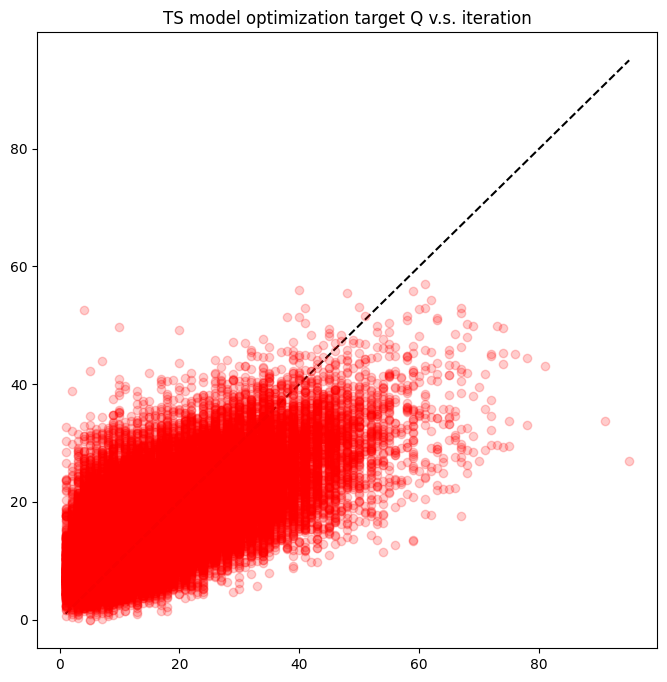

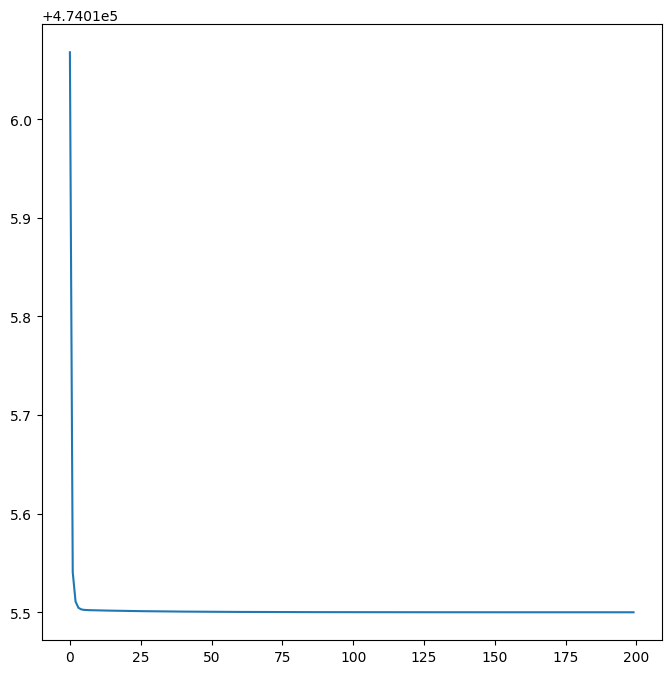

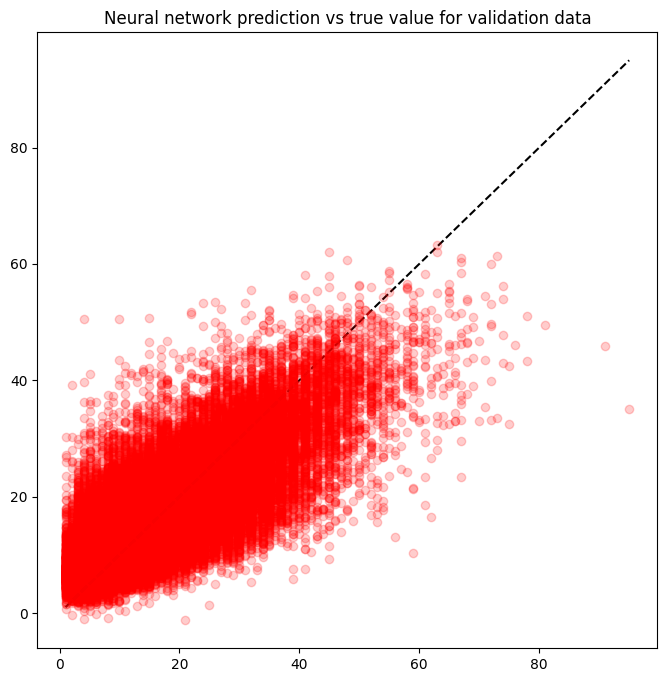

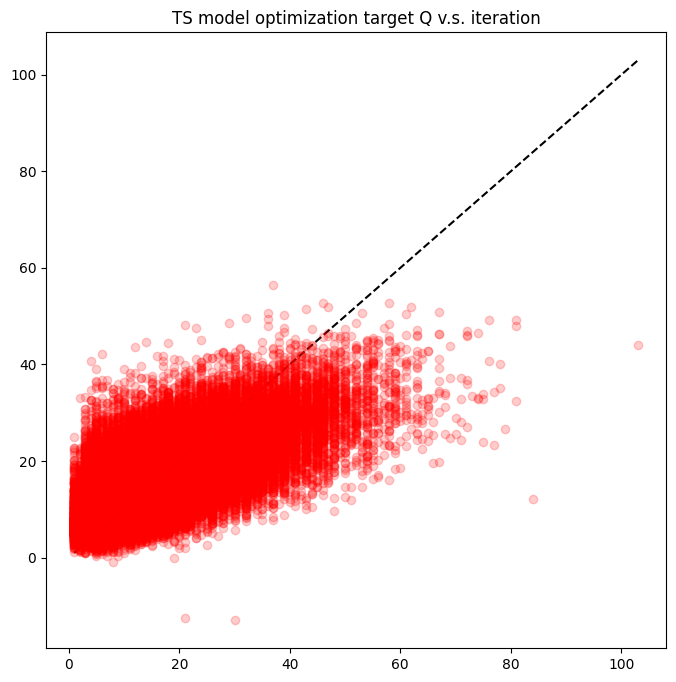

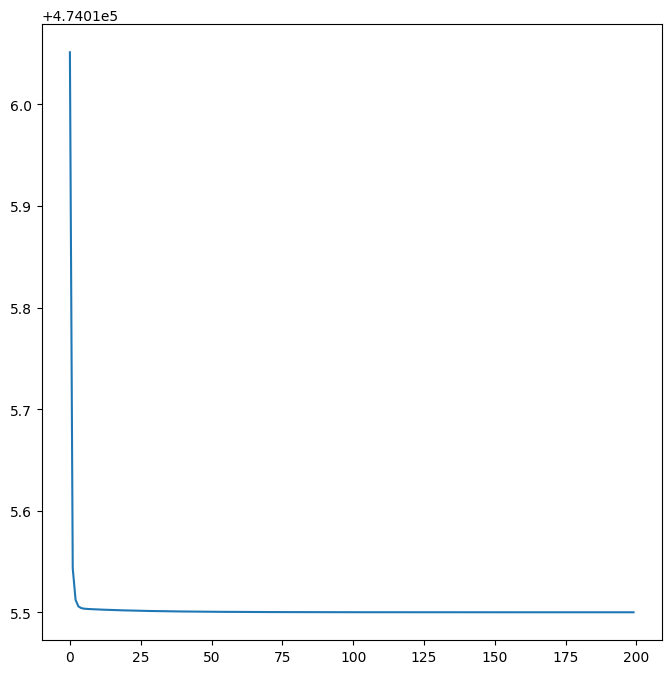

...

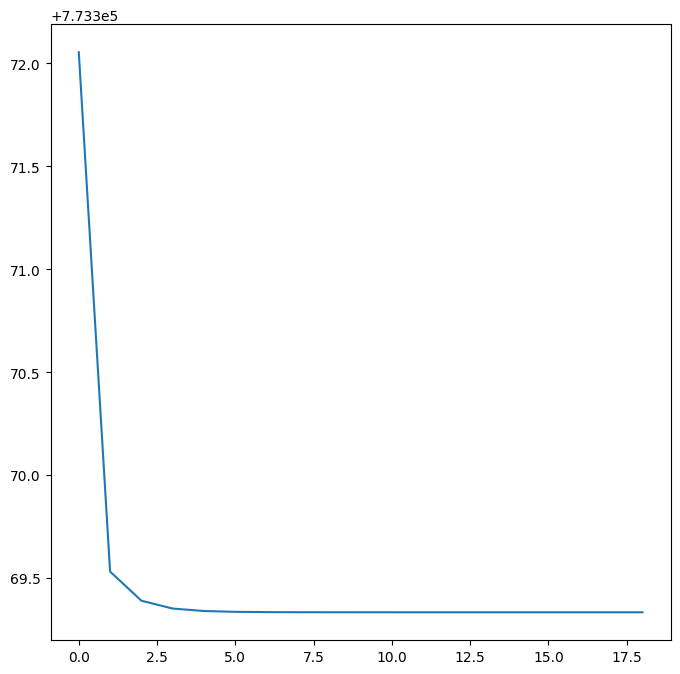

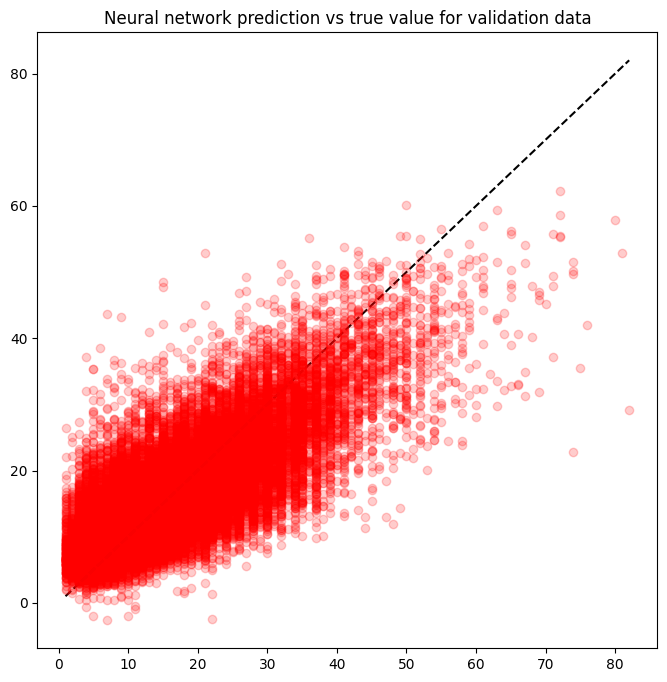

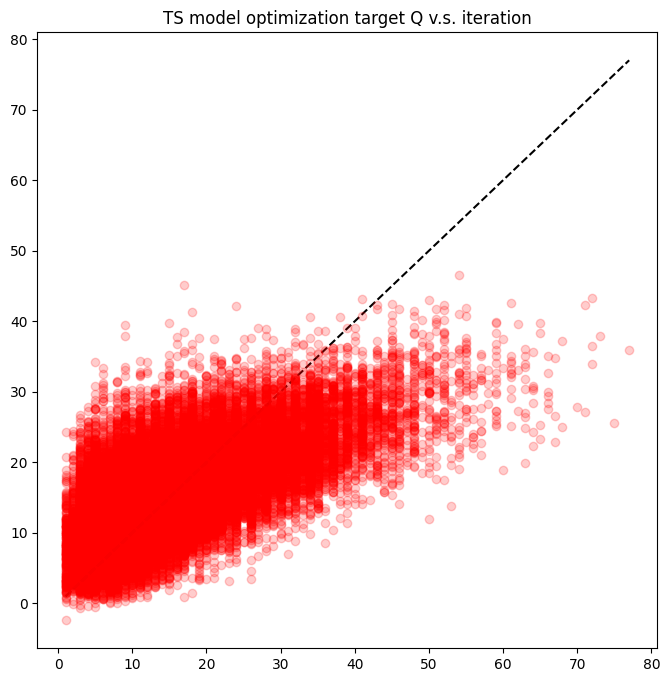

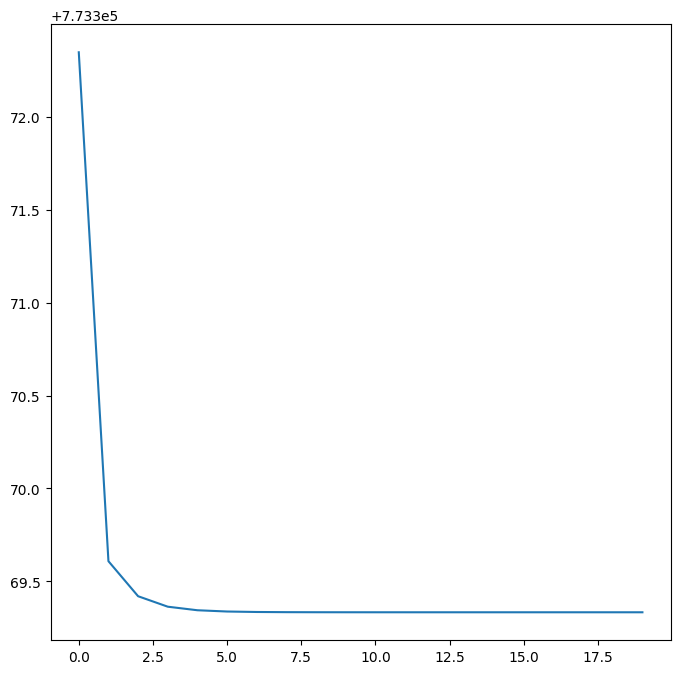

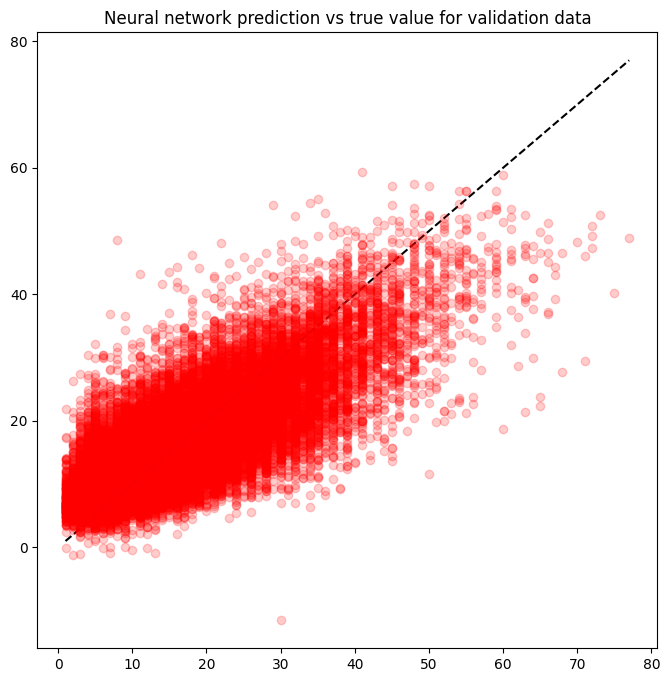

In [24]:
do_experiment(number_of_neighbour_stations, train_data)

exp
6.9398±0.0016
6.7798±0.0009
5.9694±0.0083
exp
6.7355±0.0091
6.6152±0.0069
5.9019±0.0051
exp
6.7537±0.0071
6.5832±0.0071
5.8921±0.0067
exp
6.8671±0.0051
6.7538±0.0058
5.9049±0.0078
exp
6.9555±0.0033
6.8259±0.0033
5.9346±0.0036
exp
7.0003±0.0041
6.8721±0.0031
5.931±0.0108
exp
7.0166±0.0021
6.9037±0.0027
5.962±0.0077
exp
7.3641±0.0058
7.2727±0.0088
6.0567±0.0054


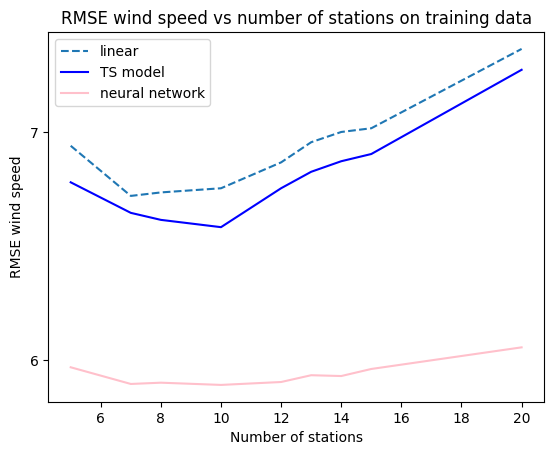

In [69]:
li_train_plot = []
fcm_train_plot = []
nn_train_plot = []
x_axis = [5,7,8, 10,12,13,14, 15,20] #number_of_neighbour_stations
for exp in training_results:
     li_train_plot.append(np.mean([d['linear_train'] for d in exp if 'linear_train' in d]))
     fcm_train_plot.append(np.mean([d['fcm_train'] for d in exp if 'fcm_train' in d]))
     nn_train_plot.append(np.mean([d['nn_train'] for d in exp if 'nn_train' in d]))

# insert the optimal value from previous experiments 
li_train_plot.insert(1, 6.7202)
fcm_train_plot.insert(1, 6.6459)
nn_train_plot.insert(1, 5.8963)

fig, ax = plt.subplots()
for axis in [ax.xaxis, ax.yaxis]:
    axis.set_major_locator(ticker.MaxNLocator(integer=True))
    
plt.plot(x_axis, li_train_plot, '--', label='linear')
plt.plot(x_axis, fcm_train_plot, label='TS model', c='blue')
plt.plot(x_axis, nn_train_plot, label='neural network', c='pink')
plt.legend(loc="upper left")
#plt.ylim(5)
plt.xlabel('Number of stations')
plt.ylabel('RMSE wind speed')
plt.title('RMSE wind speed vs number of stations on training data')

for exp in training_results:
    print('exp')
    print(f"{np.round(np.mean([d['linear_train'] for d in exp if 'linear_train' in d]), 4)}±{np.round(np.std([d['linear_train'] for d in exp if 'linear_train' in d]),4)}")
    print(f"{np.round(np.mean([d['fcm_train'] for d in exp if 'fcm_train' in d]), 4)}±{np.round(np.std([d['fcm_train'] for d in exp if 'fcm_train' in d]),4)}")
    print(f"{np.round(np.mean([d['nn_train'] for d in exp if 'nn_train' in d]), 4)}±{np.round(np.std([d['nn_train'] for d in exp if 'nn_train' in d]),4)}")


exp
6.9405±0.0064
6.7815±0.0038
5.9638±0.0158
exp
6.7366±0.0362
6.6176±0.0365
5.9086±0.0195
exp
6.7553±0.0282
6.5857±0.0263
5.9051±0.0274
exp
6.8693±0.0209
6.7574±0.0231
5.9194±0.0199
exp
6.9575±0.0134
6.8289±0.0135
5.9538±0.0156
exp
7.003±0.0169
6.8764±0.0176
5.9568±0.0098
exp
7.0196±0.009
6.9082±0.0104
5.9974±0.021
exp
7.3687±0.0245
7.2781±0.0241
6.1233±0.0252


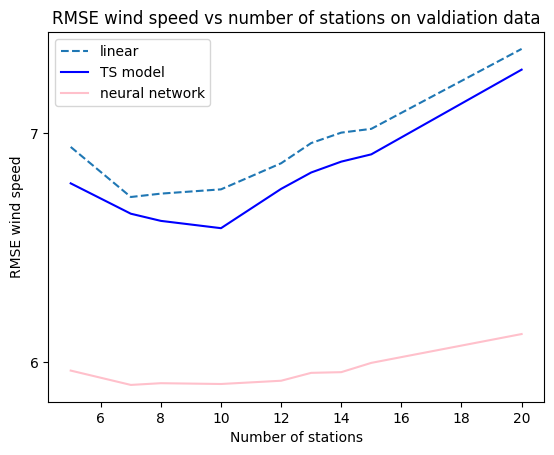

In [70]:
li_train_plot = []
fcm_train_plot = []
nn_train_plot = []
x_axis = [5,7, 8, 10,12,13,14, 15,20] #number_of_neighbour_stations
for exp in validation_results:
     li_train_plot.append(np.mean([d['linear_val'] for d in exp if 'linear_val' in d]))
     fcm_train_plot.append(np.mean([d['fcm_val'] for d in exp if 'fcm_val' in d]))
     nn_train_plot.append(np.mean([d['nn_val'] for d in exp if 'nn_val' in d]))

fig, ax = plt.subplots()
for axis in [ax.xaxis, ax.yaxis]:
    axis.set_major_locator(ticker.MaxNLocator(integer=True))

# insert the optimal value from previous experiments 
li_train_plot.insert(1, 6.7219)
fcm_train_plot.insert(1, 6.6489)
nn_train_plot.insert(1, 5.9011)


plt.plot(x_axis, li_train_plot, '--', label='linear')
plt.plot(x_axis, fcm_train_plot, label='TS model', c='blue')
plt.plot(x_axis, nn_train_plot, label='neural network', c='pink')
plt.legend(loc="upper left")
#plt.ylim(5)
plt.xlabel('Number of stations')
plt.ylabel('RMSE wind speed')
plt.title('RMSE wind speed vs number of stations on valdiation data')

for exp in validation_results:
    print('exp')
    print(f"{np.round(np.mean([d['linear_val'] for d in exp if 'linear_val' in d]), 4)}±{np.round(np.std([d['linear_val'] for d in exp if 'linear_val' in d]),4)}")
    print(f"{np.round(np.mean([d['fcm_val'] for d in exp if 'fcm_val' in d]), 4)}±{np.round(np.std([d['fcm_val'] for d in exp if 'fcm_val' in d]),4)}")
    print(f"{np.round(np.mean([d['nn_val'] for d in exp if 'nn_val' in d]), 4)}±{np.round(np.std([d['nn_val'] for d in exp if 'nn_val' in d]),4)}")


In [28]:
temp_nn = np.array(nn_histories)

In [29]:
exp = temp_nn[6]
nn_loss = exp[2]['loss']

nn_loss

[59.97038650512695,
 39.1840934753418,
 37.549644470214844,
 36.80264663696289,
 36.40392303466797,
 36.10271453857422,
 35.93540954589844,
 35.79222869873047,
 35.66222381591797,
 35.577598571777344,
 35.462364196777344,
 35.3698616027832,
 35.32655334472656,
 35.2783203125,
 35.24275588989258,
 35.174156188964844,
 35.12437438964844,
 35.075347900390625,
 35.072933197021484,
 35.01643371582031,
 34.97052001953125,
 34.96281051635742,
 34.94610595703125,
 34.898712158203125,
 34.881629943847656,
 34.880027770996094,
 34.842987060546875,
 34.86869430541992,
 34.831092834472656,
 34.83832550048828,
 34.80491638183594,
 34.78899383544922,
 34.78254699707031,
 34.7738037109375,
 34.73128890991211,
 34.75012969970703,
 34.73753356933594,
 34.734920501708984,
 34.7395133972168,
 34.71854019165039,
 34.69826889038086,
 34.70564651489258,
 34.69303512573242,
 34.696895599365234,
 34.68645477294922,
 34.685630798339844,
 34.67191696166992,
 34.66368865966797,
 34.67485046386719,
 34.6809387207

Text(0.5, 1.0, 'Loss vs number of epoches')

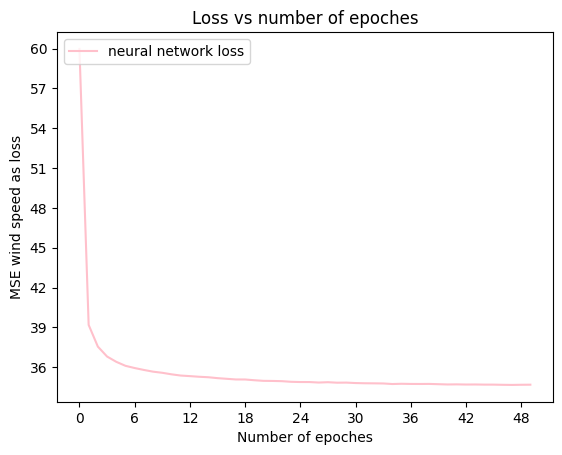

In [30]:
fig, ax = plt.subplots()
for axis in [ax.xaxis, ax.yaxis]:
    axis.set_major_locator(ticker.MaxNLocator(integer=True))
    
plt.plot(nn_loss, label='neural network loss', c='pink')
plt.legend(loc="upper left")
#plt.ylim(5)
plt.xlabel('Number of epoches')
plt.ylabel('MSE wind speed as loss')
plt.title('Loss vs number of epoches')

In [67]:
training_times

[{'linear_train': 0.3765714168548584},
 {'fcm_train': 116.04338264465332},
 {'nn_train': 964.5471985340118},
 {'linear_train': 0.36831212043762207},
 {'fcm_train': 116.35098361968994},
 {'nn_train': 959.7742884159088},
 {'linear_train': 0.35303354263305664},
 {'fcm_train': 115.69878363609314},
 {'nn_train': 956.5982434749603},
 {'linear_train': 0.36574363708496094},
 {'fcm_train': 114.73931908607483},
 {'nn_train': 962.4750809669495},
 {'linear_train': 0.39925098419189453},
 {'fcm_train': 113.09732675552368},
 {'nn_train': 963.9660270214081},
 {'linear_train': 1.1127948760986328},
 {'fcm_train': 172.19474124908447},
 {'nn_train': 1815.8803176879883},
 {'linear_train': 1.1124420166015625},
 {'fcm_train': 170.71709537506104},
 {'nn_train': 1875.0114715099335},
 {'linear_train': 0.9998042583465576},
 {'fcm_train': 165.53734135627747},
 {'nn_train': 1936.9955666065216},
 {'linear_train': 1.0315792560577393},
 {'fcm_train': 177.52315592765808},
 {'nn_train': 1689.4033303260803},
 {'linear_t

In [61]:
# Source: https://stackoverflow.com/questions/2231663/slicing-a-list-into-a-list-of-sub-lists
grouped_training_times = [training_times[i:i+15] for i in range(0, len(training_times), 15)]        # Use xrange in py2k

Text(0.5, 1.0, 'Model traning time per fold')

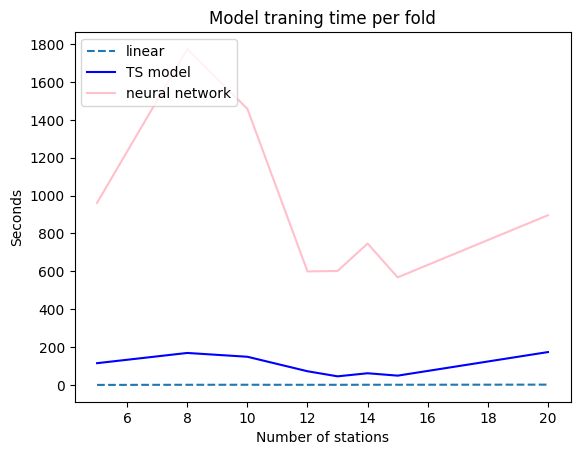

In [66]:
li_time_plot = []
fcm_time_plot = []
nn_time_plot = []
x_axis = [5,8, 10,12,13,14, 15,20] #number_of_neighbour_stations
for exp in grouped_training_times:
    li_time_plot.append(np.mean([d['linear_train'] for d in exp if 'linear_train' in d]))
    fcm_time_plot.append(np.mean([d['fcm_train'] for d in exp if 'fcm_train' in d]))
    nn_time_plot.append(np.mean([d['nn_train'] for d in exp if 'nn_train' in d]))

fig, ax = plt.subplots()
for axis in [ax.xaxis, ax.yaxis]:
    axis.set_major_locator(ticker.MaxNLocator(integer=True))
    
plt.plot(x_axis, li_time_plot, '--', label='linear')
plt.plot(x_axis, fcm_time_plot, label='TS model', c='blue')
plt.plot(x_axis, nn_time_plot, label='neural network', c='pink')
plt.legend(loc="upper left")
plt.xlabel('Number of stations')
plt.ylabel('Seconds')
plt.title('Model traning time per fold')


In [72]:
opt_x = pd.read_csv('Data/exp/1016completed/10x.csv')
opt_y = pd.read_csv('Data/exp/1016completed/10y.csv')

FCM traning RMSE: 4.7041978587581745
FCM traning RMSE: 4.578349891095775
FCM traning RMSE: 4.462840415679469
FCM traning RMSE: 4.37252234427543
FCM traning RMSE: 4.331001145241712
FCM traning RMSE: 4.247307560494564
FCM traning RMSE: 4.212377299815498
FCM traning RMSE: 4.159740246808089
FCM traning RMSE: 4.140635021023132
FCM traning RMSE: 4.109718360390749
FCM traning RMSE: 4.082638429622358
FCM traning RMSE: 4.040184030129435
FCM traning RMSE: 4.024720698170112


ValueError: Input could not be cast to an at-least-1D NumPy array

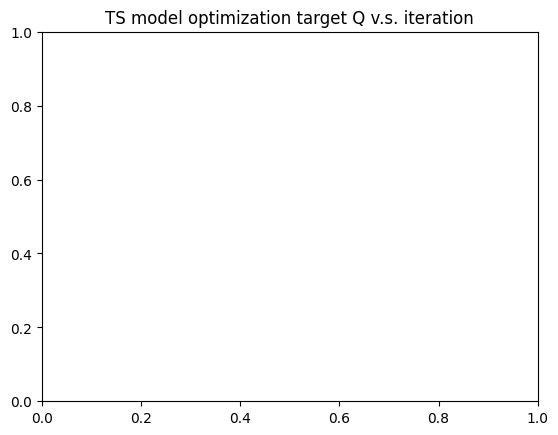

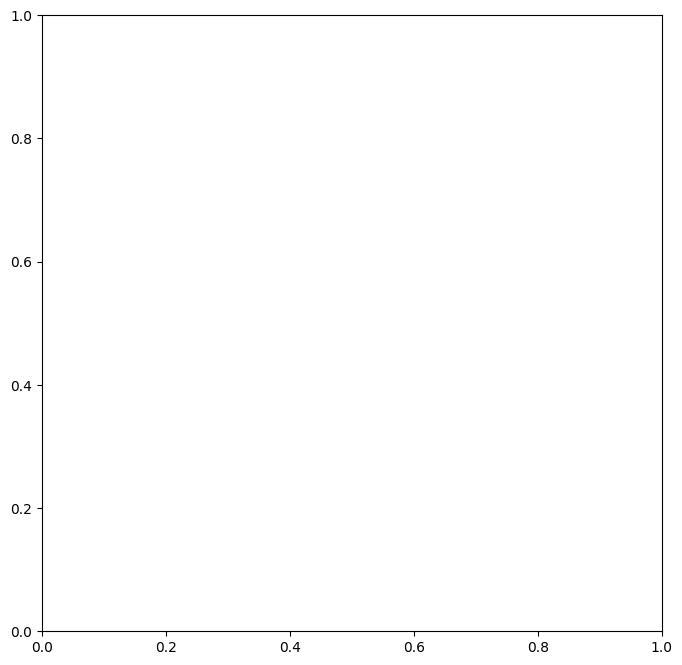

In [74]:
# Plot Q vs # of Nc
# Fcm hyperparameters
FCM_Ncs = [2,3,5,8,10,15,20,25,30,40,50,80,100]
FCM_m = 2
tol = 1e-5
max_iter = 200
qs = []

for FCM_Nc in FCM_Ncs:   
    N = opt_x.shape[0]
    U = np.random.rand(N, FCM_Nc)
    U = U / np.sum(U, axis=1, keepdims=True)
    temp_qs = []

    # Fuzzy C-Means 聚类
    for _ in range(max_iter):
        U_old = U.copy()
        mf = U ** FCM_m
        cen = np.dot(mf.T, opt_x) / np.sum(mf, axis=0, keepdims=True).T
        dists = cdist(opt_x, cen)
        tmp = np.power(dists, -2 / (FCM_m - 1))
        U = tmp / np.sum(tmp, axis=1, keepdims=True)

        q = np.sum((U ** FCM_m) * (dists ** 2))
        temp_qs.append(q)

        # 检查是否收敛
        if np.linalg.norm(U - U_old) < tol:
            break
    # 模型训练 find if this can be optimized
    z = np.hstack((np.ones((N, 1)), opt_x))
    H = np.zeros((N, FCM_Nc * (opt_x.shape[1] + 1)))

    # 生成模糊规则矩阵 H
    for j in range(FCM_Nc):
        Uj = np.tile(U[:, j], (opt_x.shape[1] + 1, 1)).T
        H[:, (j * (opt_x.shape[1] + 1)):((j + 1) * (opt_x.shape[1] + 1))] = Uj * z

    # 计算权重 W
    W = pinv(np.dot(H.T, H)).dot(H.T).dot(opt_y)

        
    # 在训练集上进行预测
    y_hat_train = np.dot(H, W)
    mse_train = mean_squared_error(opt_y, y_hat_train)
    rmse_train = sqrt(mean_squared_error(opt_y, y_hat_train))
    print("FCM traning RMSE:", rmse_train)
    qs.append(temp_qs)
    
plt.title('TS model optimization target Q v.s. iteration')
plt.figure(figsize=(8,8))
plt.plot(qs)

Text(0.5, 1.0, 'TS model optimization target Q v.s. iteration for differenct number of rules')

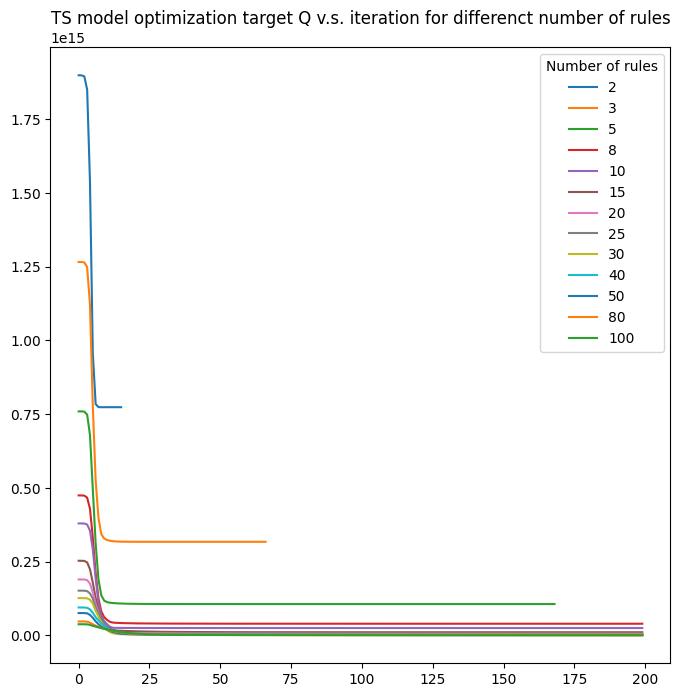

In [90]:
plt.figure(figsize=(8,8))

for exp in qs:
    plt.plot(exp)

plt.legend(FCM_Ncs, title="Number of rules")
plt.title('TS model optimization target Q v.s. iteration for differenct number of rules')